In [227]:
import pandas as pd
df = pd.read_excel('Warm Water Volume.xlsx')
df.head()


,Date,Volume,Anomaly,ENSO index,Scaled ENSO index,Unnamed: 5
0,1980-01-01,2605404000000000,76573630000000,0.70,7.000000e+13,1.000000e+14
1,1980-02-01,2564434000000000,70049310000000,0.39,3.900000e+13,NaN
2,1980-03-01,2514065000000000,52408530000000,0.28,2.800000e+13,NaN
3,1980-04-01,2468250000000000,40088690000000,0.34,3.400000e+13,NaN
4,1980-05-01,2439852000000000,40209750000000,0.51,5.100000e+13,NaN


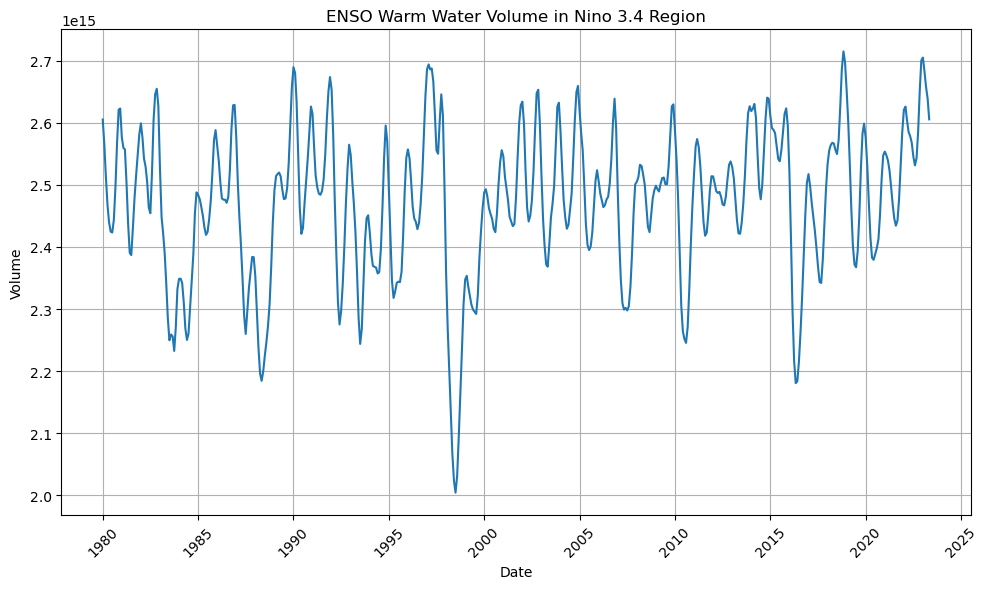

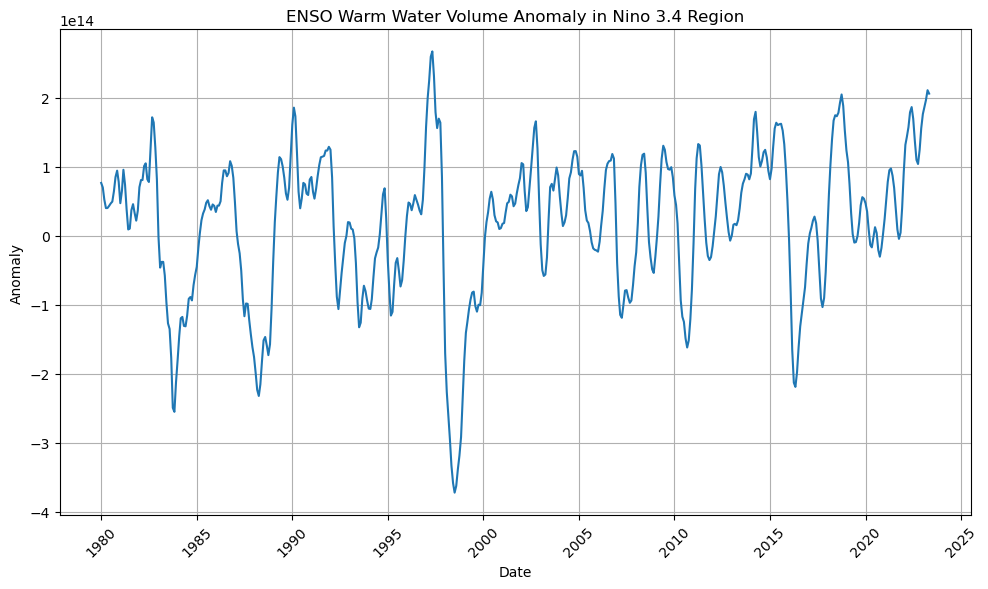

In [185]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df['Date'], df['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('ENSO Warm Water Volume in Nino 3.4 Region')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(df['Date'], df['Anomaly'])
plt.xlabel('Date')
plt.ylabel('Anomaly')
plt.title('ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

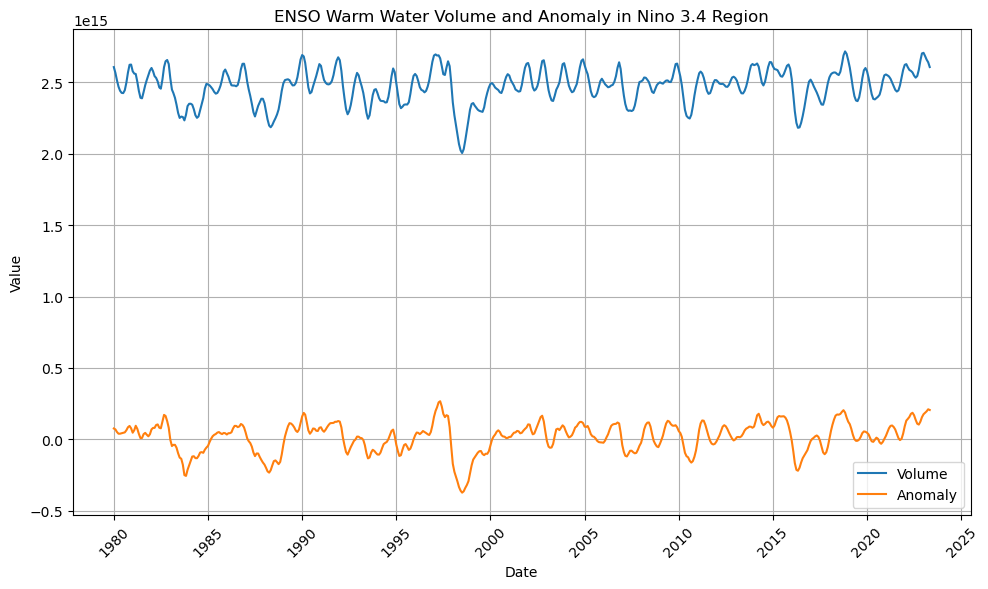

In [186]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(df['Date'], df['Volume'], label='Volume')
ax.plot(df['Date'], df['Anomaly'], label='Anomaly')

ax.set_xlabel('Date')
ax.set_ylabel('Value')
ax.set_title('ENSO Warm Water Volume and Anomaly in Nino 3.4 Region')
ax.grid(True)
plt.xticks(rotation=45)
ax.legend()
plt.tight_layout()
plt.show()


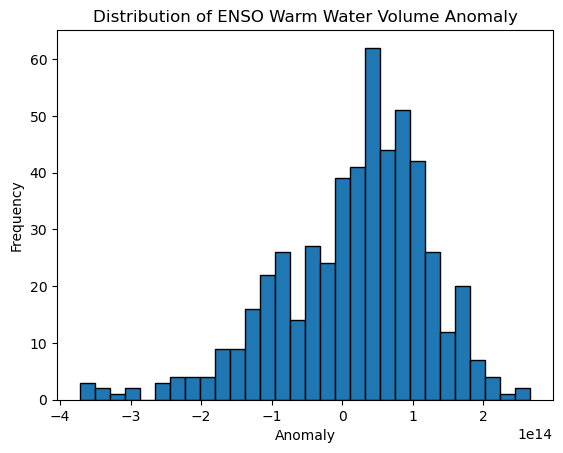

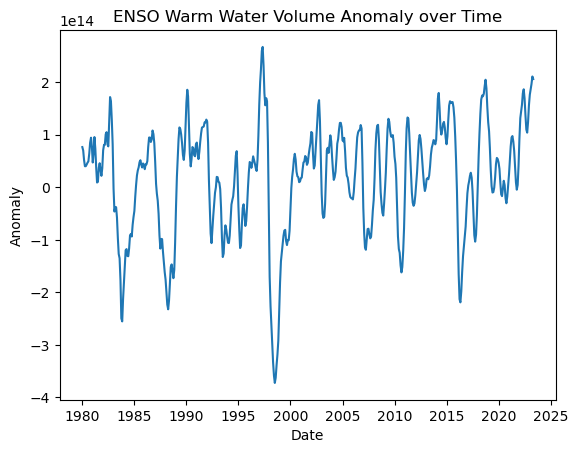

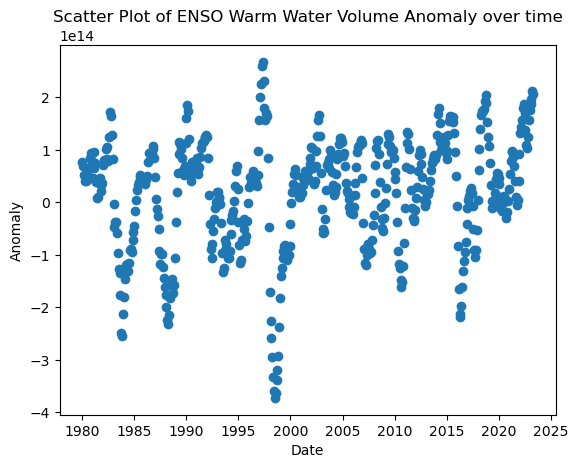

In [187]:
import matplotlib.pyplot as plt

# Histogram
plt.hist(df['Anomaly'], bins=30, edgecolor='black')
plt.xlabel('Anomaly')
plt.ylabel('Frequency')
plt.title('Distribution of ENSO Warm Water Volume Anomaly')
plt.show()

# Line plot
plt.plot(df['Date'], df['Anomaly'])
plt.xlabel('Date')
plt.ylabel('Anomaly')
plt.title('ENSO Warm Water Volume Anomaly over Time')
plt.show()

# Scatter plot
plt.scatter(df['Date'], df['Anomaly'])
plt.xlabel('Date')
plt.ylabel('Anomaly')
plt.title('Scatter Plot of ENSO Warm Water Volume Anomaly over time')
plt.show()


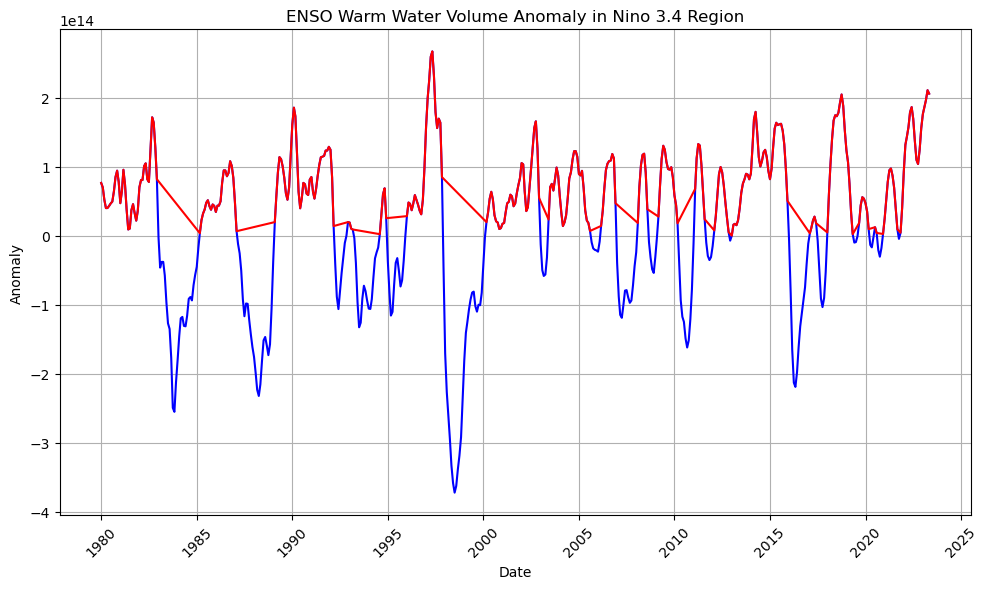

In [188]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

anomaly_values = df['Anomaly']
positive_mask = anomaly_values >= 0
negative_mask = anomaly_values < 0

ax.plot(df['Date'], anomaly_values, color='blue')
ax.plot(df['Date'][positive_mask], anomaly_values[positive_mask], color='red')

ax.set_xlabel('Date')
ax.set_ylabel('Anomaly')
ax.set_title('ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax.grid(True)

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


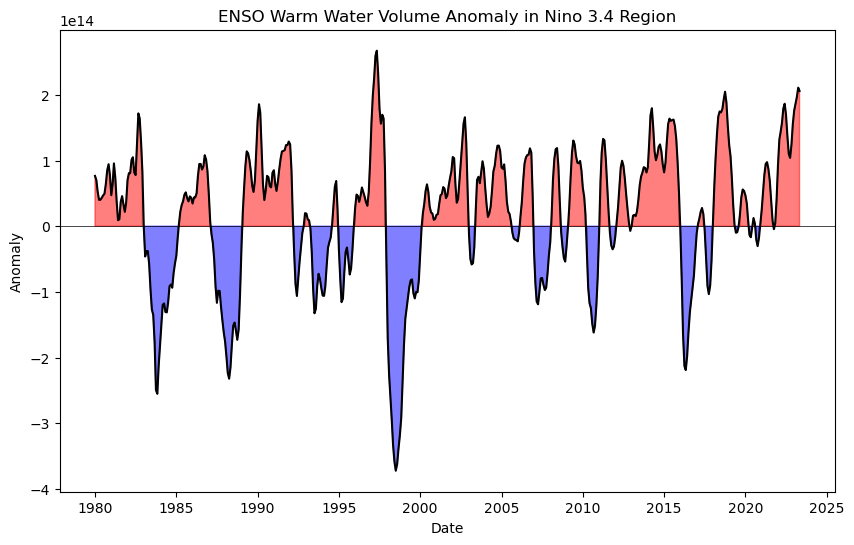

In [189]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

df['Date'] = pd.to_datetime(df['Date'])
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(df['Date'], df['Anomaly'], color='black')
ax.fill_between(df['Date'], df['Anomaly'], where=df['Anomaly'] >= 0, color='red', alpha=0.5)
ax.fill_between(df['Date'], df['Anomaly'], where=df['Anomaly'] < 0, color='blue', alpha=0.5)
ax.axhline(0, color='black', linewidth=0.5)
ax.set_xlabel('Date')
ax.set_ylabel('Anomaly')
ax.set_title('ENSO Warm Water Volume Anomaly in Nino 3.4 Region')

plt.show()


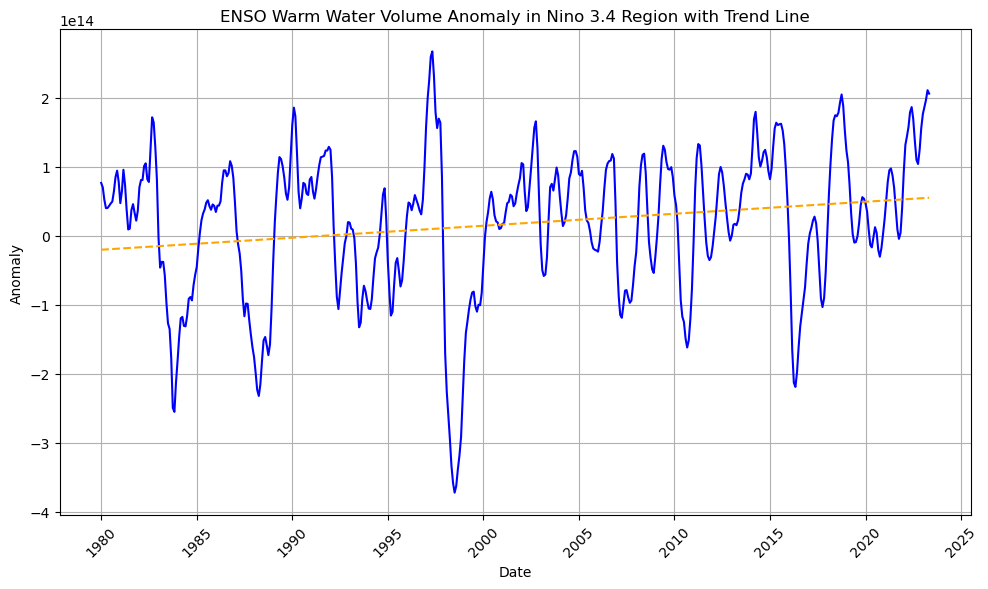

In [190]:
import matplotlib.pyplot as plt
import numpy as np

date_values = np.arange(len(df['Date']))
anomaly_values = df['Anomaly'].values

coefficients = np.polyfit(date_values, anomaly_values, deg=1)
trend_line = np.polyval(coefficients, date_values)

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df['Date'], anomaly_values, color='blue')
ax.plot(df['Date'], trend_line, color='orange', linestyle='--')

ax.set_xlabel('Date')
ax.set_ylabel('Anomaly')
ax.set_title('ENSO Warm Water Volume Anomaly in Nino 3.4 Region with Trend Line')
ax.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


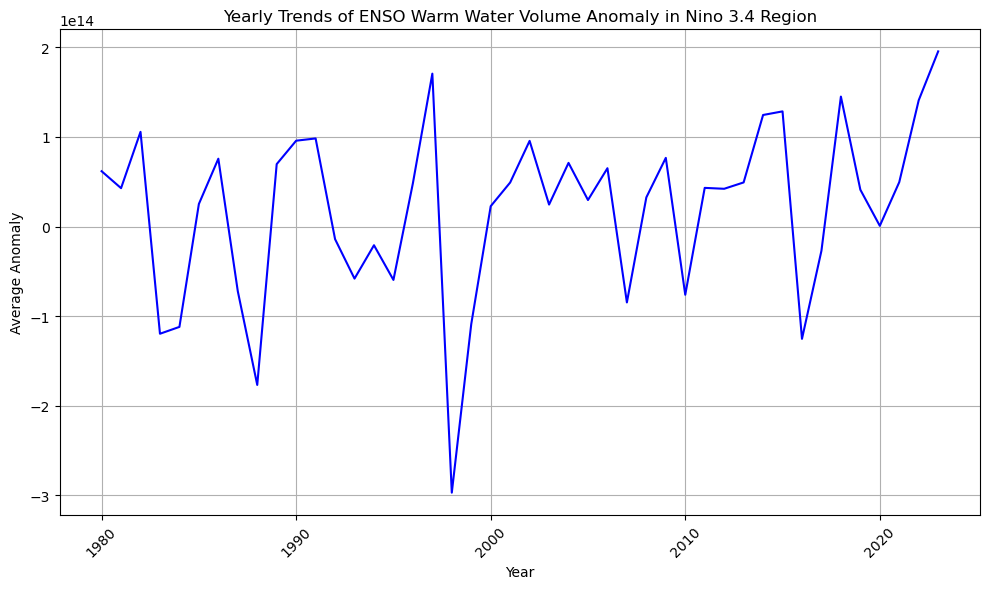

In [191]:
import matplotlib.pyplot as plt
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])

df['Year'] = df['Date'].dt.year
yearly_average = df.groupby('Year')['Anomaly'].mean()
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(yearly_average.index, yearly_average, color='blue')

ax.set_xlabel('Year')
ax.set_ylabel('Average Anomaly')
ax.set_title('Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax.grid(True)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


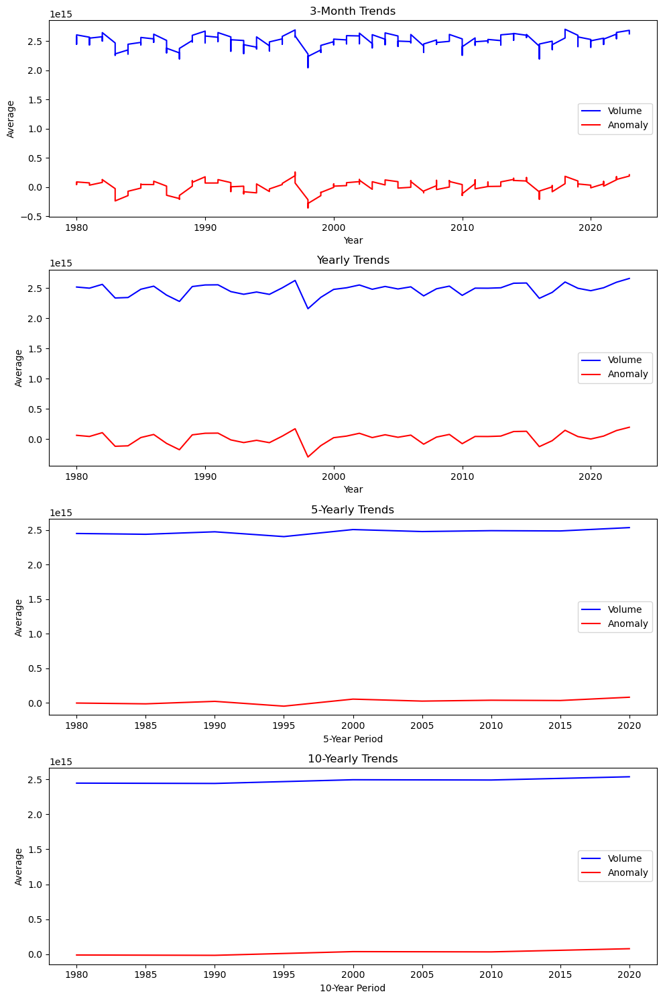

In [192]:
import matplotlib.pyplot as plt
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])

df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Quarter'] = df['Date'].dt.quarter
seasonal_average = df.groupby(['Year', 'Quarter']).agg({'Volume': 'mean', 'Anomaly': 'mean'})
yearly_average = df.groupby('Year').agg({'Volume': 'mean', 'Anomaly': 'mean'})
five_year_average = df.groupby(df['Year'] // 5 * 5).agg({'Volume': 'mean', 'Anomaly': 'mean'})
ten_year_average = df.groupby(df['Year'] // 10 * 10).agg({'Volume': 'mean', 'Anomaly': 'mean'})

fig, axes = plt.subplots(nrows=4, figsize=(10, 15))

axes[0].plot(seasonal_average.index.get_level_values('Year'), seasonal_average['Volume'], color='blue', label='Volume')
axes[0].plot(seasonal_average.index.get_level_values('Year'), seasonal_average['Anomaly'], color='red', label='Anomaly')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Average')
axes[0].set_title('3-Month Trends')
axes[0].legend()

axes[1].plot(yearly_average.index, yearly_average['Volume'], color='blue', label='Volume')
axes[1].plot(yearly_average.index, yearly_average['Anomaly'], color='red', label='Anomaly')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Average')
axes[1].set_title('Yearly Trends')
axes[1].legend()

axes[2].plot(five_year_average.index, five_year_average['Volume'], color='blue', label='Volume')
axes[2].plot(five_year_average.index, five_year_average['Anomaly'], color='red', label='Anomaly')
axes[2].set_xlabel('5-Year Period')
axes[2].set_ylabel('Average')
axes[2].set_title('5-Yearly Trends')
axes[2].legend()

axes[3].plot(ten_year_average.index, ten_year_average['Volume'], color='blue', label='Volume')
axes[3].plot(ten_year_average.index, ten_year_average['Anomaly'], color='red', label='Anomaly')
axes[3].set_xlabel('10-Year Period')
axes[3].set_ylabel('Average')
axes[3].set_title('10-Yearly Trends')
axes[3].legend()

plt.tight_layout()

plt.show()


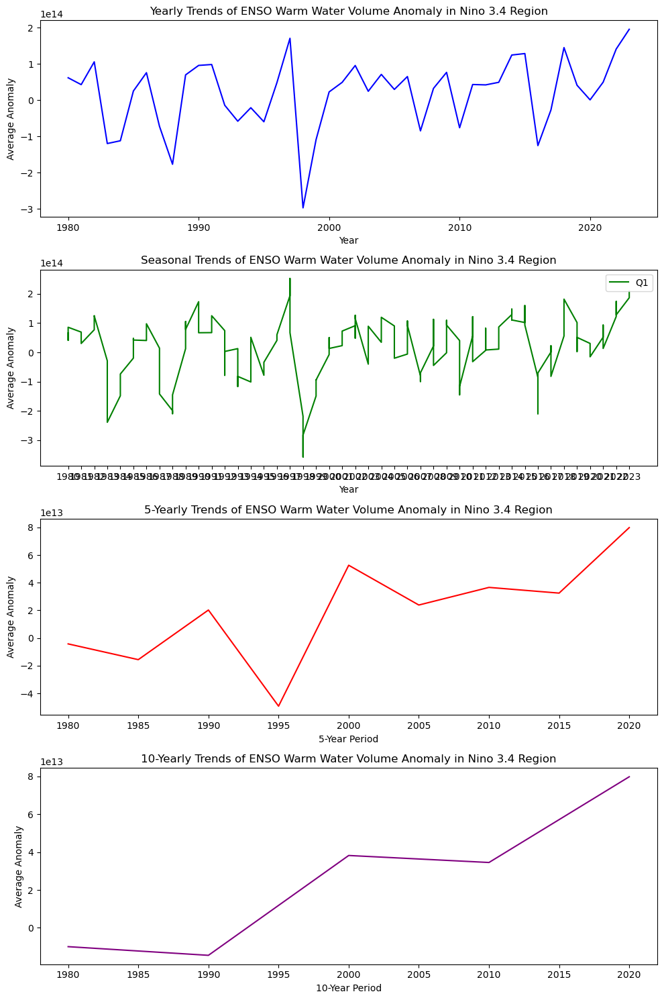

In [193]:
import matplotlib.pyplot as plt
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Quarter'] = df['Date'].dt.quarter

yearly_average = df.groupby('Year')['Anomaly'].mean()
seasonal_average = df.groupby(['Year', 'Quarter'])['Anomaly'].mean()
five_year_average = df.groupby(df['Year'] // 5 * 5)['Anomaly'].mean()
ten_year_average = df.groupby(df['Year'] // 10 * 10)['Anomaly'].mean()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, figsize=(10, 15))

ax1.plot(yearly_average.index, yearly_average, color='blue')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Anomaly')
ax1.set_title('Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')

seasons = ['Q1', 'Q2', 'Q3', 'Q4']
ax2.plot(seasonal_average.index.get_level_values('Year'), seasonal_average, color='green')
ax2.set_xlabel('Year')
ax2.set_ylabel('Average Anomaly')
ax2.set_title('Seasonal Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax2.set_xticks(seasonal_average.index.get_level_values('Year').unique())
ax2.set_xticklabels(seasonal_average.index.get_level_values('Year').unique())
ax2.legend(seasons)

ax3.plot(five_year_average.index, five_year_average, color='red')
ax3.set_xlabel('5-Year Period')
ax3.set_ylabel('Average Anomaly')
ax3.set_title('5-Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')

ax4.plot(ten_year_average.index, ten_year_average, color='purple')
ax4.set_xlabel('10-Year Period')
ax4.set_ylabel('Average Anomaly')
ax4.set_title('10-Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')

plt.tight_layout()

plt.show()


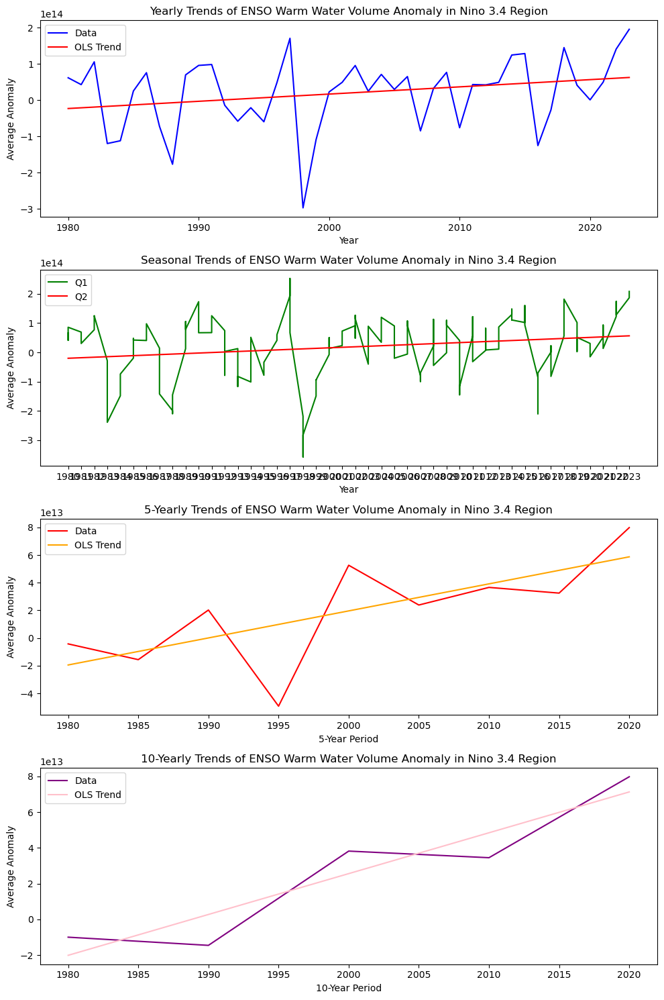

In [194]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import statsmodels.api as sm

df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Quarter'] = df['Date'].dt.quarter

yearly_average = df.groupby('Year')['Anomaly'].mean()
seasonal_average = df.groupby(['Year', 'Quarter'])['Anomaly'].mean()
five_year_average = df.groupby(df['Year'] // 5 * 5)['Anomaly'].mean()
ten_year_average = df.groupby(df['Year'] // 10 * 10)['Anomaly'].mean()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, figsize=(10, 15))

ax1.plot(yearly_average.index, yearly_average, color='blue', label='Data')
X = sm.add_constant(yearly_average.index)
model = sm.OLS(yearly_average, X)
results = model.fit()
ax1.plot(yearly_average.index, results.fittedvalues, color='red', label='OLS Trend')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Anomaly')
ax1.set_title('Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax1.legend()

seasons = ['Q1', 'Q2', 'Q3', 'Q4']
ax2.plot(seasonal_average.index.get_level_values('Year'), seasonal_average, color='green', label='Data')
X = sm.add_constant(seasonal_average.index.get_level_values('Year'))
model = sm.OLS(seasonal_average, X)
results = model.fit()
ax2.plot(seasonal_average.index.get_level_values('Year'), results.fittedvalues, color='red', label='OLS Trend')
ax2.set_xlabel('Year')
ax2.set_ylabel('Average Anomaly')
ax2.set_title('Seasonal Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax2.set_xticks(seasonal_average.index.get_level_values('Year').unique())
ax2.set_xticklabels(seasonal_average.index.get_level_values('Year').unique())
ax2.legend(seasons)

ax3.plot(five_year_average.index, five_year_average, color='red', label='Data')
X = sm.add_constant(five_year_average.index)
model = sm.OLS(five_year_average, X)
results = model.fit()
ax3.plot(five_year_average.index, results.fittedvalues, color='orange', label='OLS Trend')
ax3.set_xlabel('5-Year Period')
ax3.set_ylabel('Average Anomaly')
ax3.set_title('5-Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax3.legend()

ax4.plot(ten_year_average.index, ten_year_average, color='purple', label='Data')
X = sm.add_constant(ten_year_average.index)
model = sm.OLS(ten_year_average, X)
results = model.fit()
ax4.plot(ten_year_average.index, results.fittedvalues, color='pink', label='OLS Trend')
ax4.set_xlabel('10-Year Period')
ax4.set_ylabel('Average Anomaly')
ax4.set_title('10-Yearly Trends of ENSO Warm Water Volume Anomaly in Nino 3.4 Region')
ax4.legend()

plt.tight_layout()

plt.show()


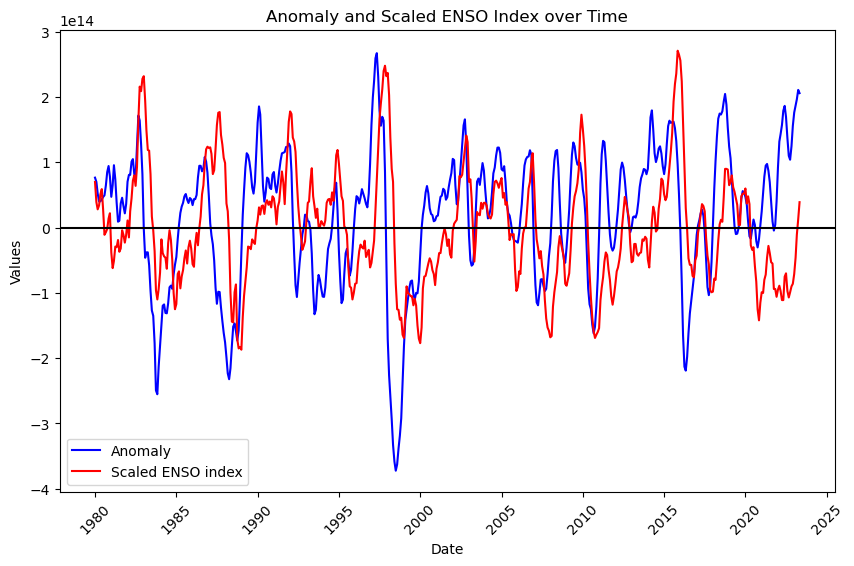

In [195]:
import pandas as pd
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])

plt.figure(figsize=(10, 6)) 
plt.plot(df['Date'], df['Anomaly'], color='blue', label='Anomaly')
plt.plot(df['Date'], df['Scaled ENSO index'], color='red', label='Scaled ENSO index')
plt.axhline(y=0, color='black')

plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Anomaly and Scaled ENSO Index over Time')
plt.legend()
plt.xticks(rotation=45)

plt.show()


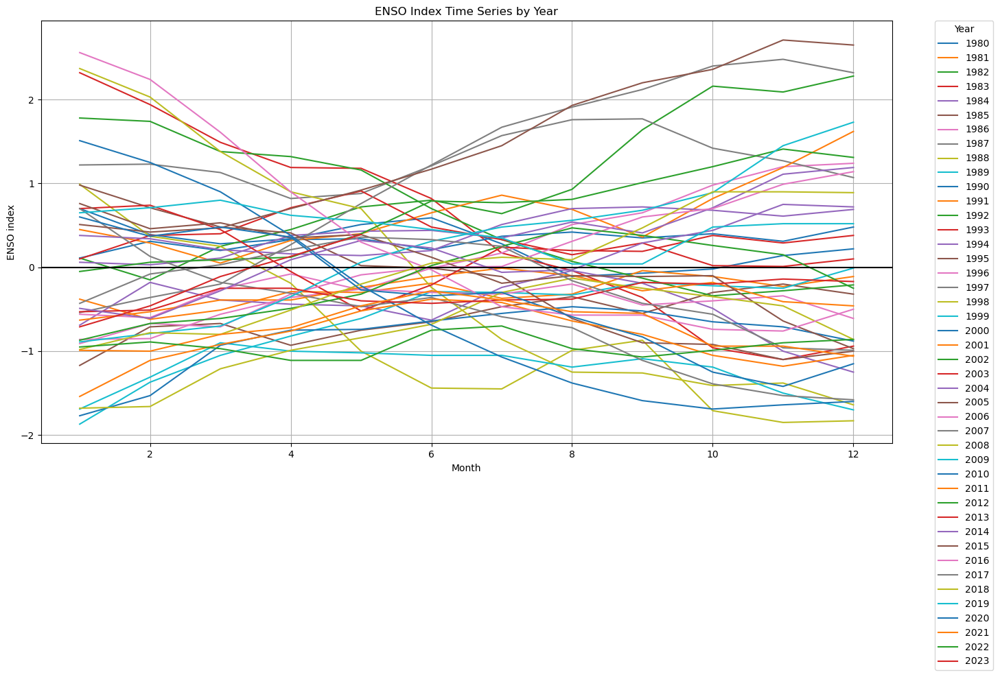

In [196]:
import pandas as pd
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year

plt.figure(figsize=(16,8))  

for year in df['Year'].unique():
    year_data = df[df['Year'] == year]
    plt.plot(year_data['Date'].dt.month, year_data['ENSO index'], label=str(year))

plt.axhline(y=0, color='black')
plt.xlabel('Month')
plt.ylabel('ENSO index')
plt.title('ENSO Index Time Series by Year')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = 'Year')
plt.grid(True)

plt.show()


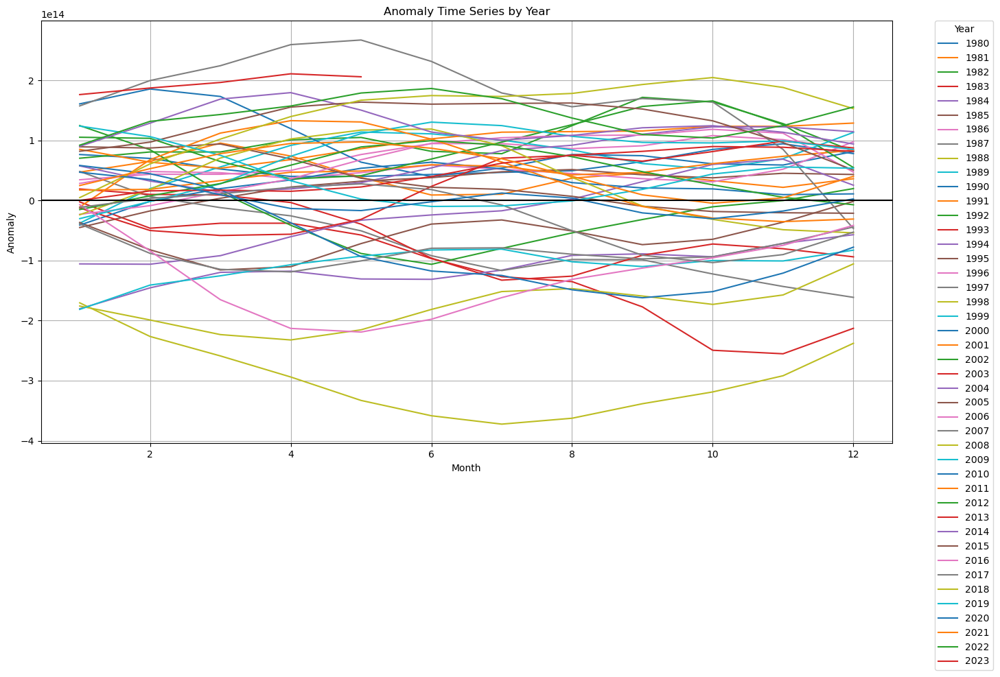

In [197]:
import pandas as pd
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year

plt.figure(figsize=(16,8))  

for year in df['Year'].unique():
    year_data = df[df['Year'] == year]
    plt.plot(year_data['Date'].dt.month, year_data['Anomaly'], label=str(year))

plt.axhline(y=0, color='black')
plt.xlabel('Month')
plt.ylabel('Anomaly')
plt.title('Anomaly Time Series by Year')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = 'Year')
plt.grid(True)

plt.show()


In [198]:
df2 = pd.read_excel('ENSO_modified.xlsx')
print(df2)

   Year  1950  1951  1952  1953  1954  1955  1956  1957  1958  ...  2013  \
0   DJF  -1.5  -0.8   0.5   0.4   0.8  -0.7  -1.1  -0.2   1.8  ...  -0.4   
1   JFM  -1.3  -0.5   0.4   0.6   0.5  -0.6  -0.8   0.1   1.7  ...  -0.4   
2   FMA  -1.2  -0.2   0.3   0.6   0.0  -0.7  -0.6   0.4   1.3  ...  -0.3   
3   MAM  -1.2   0.2   0.3   0.7  -0.4  -0.8  -0.5   0.7   0.9  ...  -0.3   
4   AMJ  -1.1   0.4   0.2   0.8  -0.5  -0.8  -0.5   0.9   0.7  ...  -0.4   
5   MJJ  -0.9   0.6   0.0   0.8  -0.5  -0.7  -0.5   1.1   0.6  ...  -0.4   
6   JJA  -0.5   0.7  -0.1   0.7  -0.6  -0.7  -0.6   1.3   0.6  ...  -0.4   
7   JAS  -0.4   0.9   0.0   0.7  -0.8  -0.7  -0.6   1.3   0.4  ...  -0.3   
8   ASO  -0.4   1.0   0.2   0.8  -0.9  -1.1  -0.5   1.3   0.4  ...  -0.3   
9   SON  -0.4   1.2   0.1   0.8  -0.8  -1.4  -0.4   1.4   0.4  ...  -0.2   
10  OND  -0.6   1.0   0.0   0.8  -0.7  -1.7  -0.4   1.5   0.5  ...  -0.2   
11  NDJ  -0.8   0.8   0.1   0.8  -0.7  -1.5  -0.4   1.7   0.6  ...  -0.3   

    2014  2

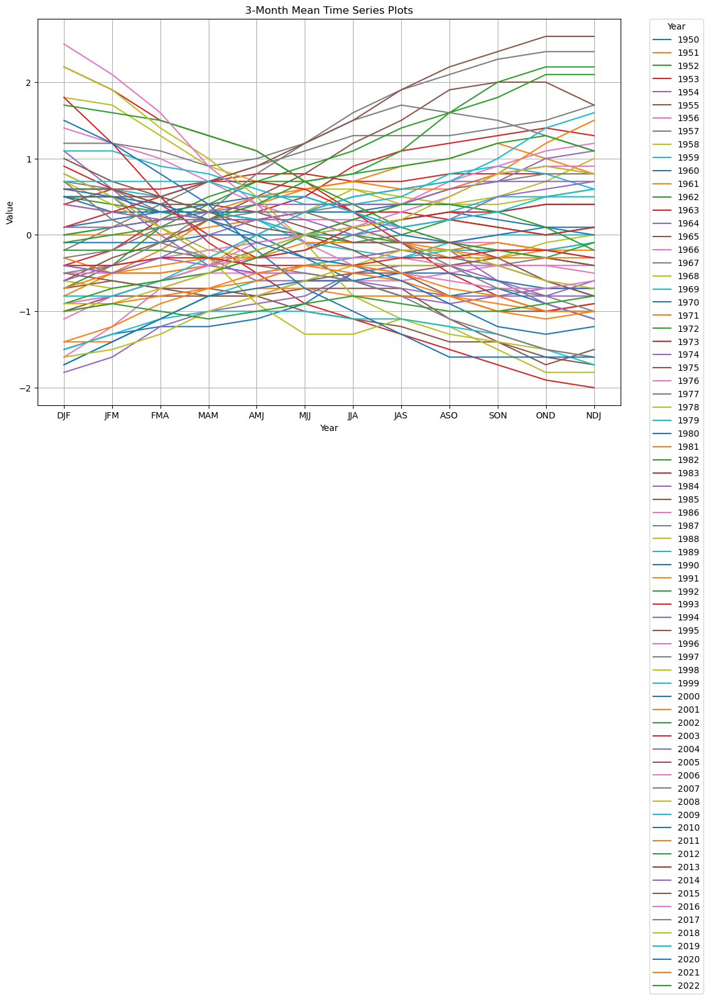

In [199]:
import pandas as pd
import matplotlib.pyplot as plt

years = df2['Year']
plt.figure(figsize=(12, 8)) 
for column in df2.columns[1:]:
    plt.plot(years, df2[column], label=column)

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('3-Month Mean Time Series Plots')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = 'Year')
plt.grid(True)

plt.show()


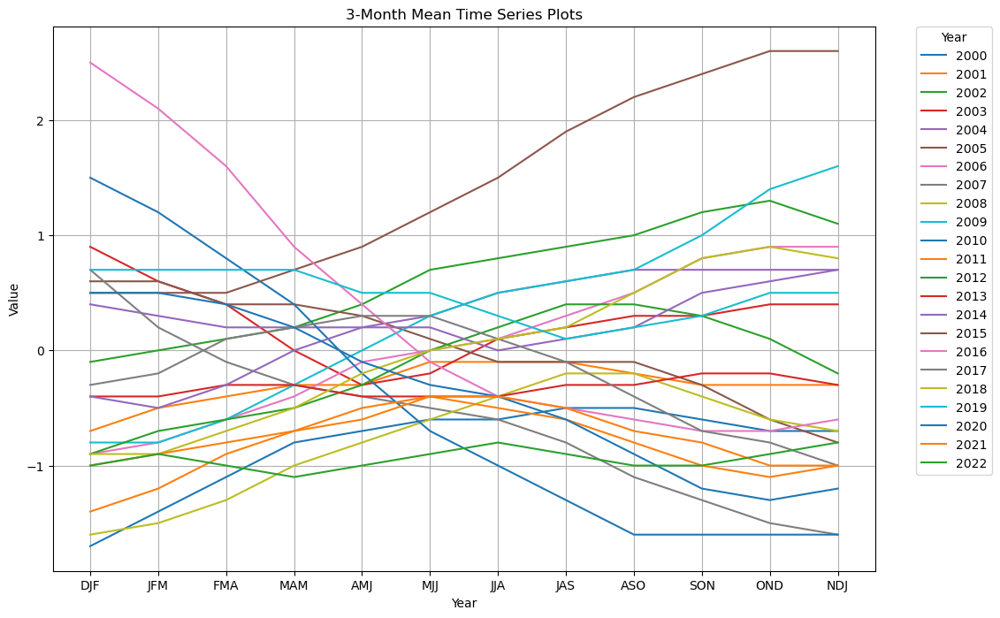

In [200]:
import pandas as pd
import matplotlib.pyplot as plt

years = df2['Year']
plt.figure(figsize=(12, 8)) 
for column in df2.columns[51:]:
    plt.plot(years, df2[column], label=column)

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('3-Month Mean Time Series Plots')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = 'Year')
plt.grid(True)

plt.show()

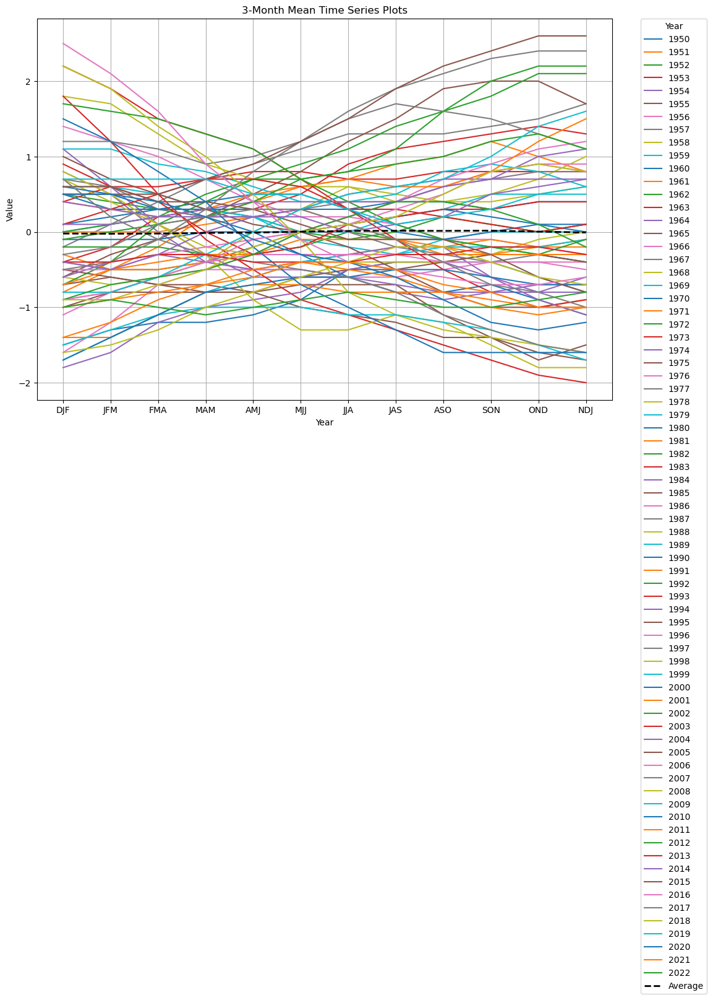

In [201]:
import pandas as pd
import matplotlib.pyplot as plt

years = df2['Year']
plt.figure(figsize=(12, 8)) 
for column in df2.columns[1:]:
    plt.plot(years, df2[column], label=column)

average_line = df2.iloc[:, 1:].mean(axis=1)
plt.plot(years, average_line, label='Average', linewidth=2, linestyle='--', color = 'black')


plt.xlabel('Year')
plt.ylabel('Value')
plt.title('3-Month Mean Time Series Plots')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Year')
plt.grid(True)

plt.show()


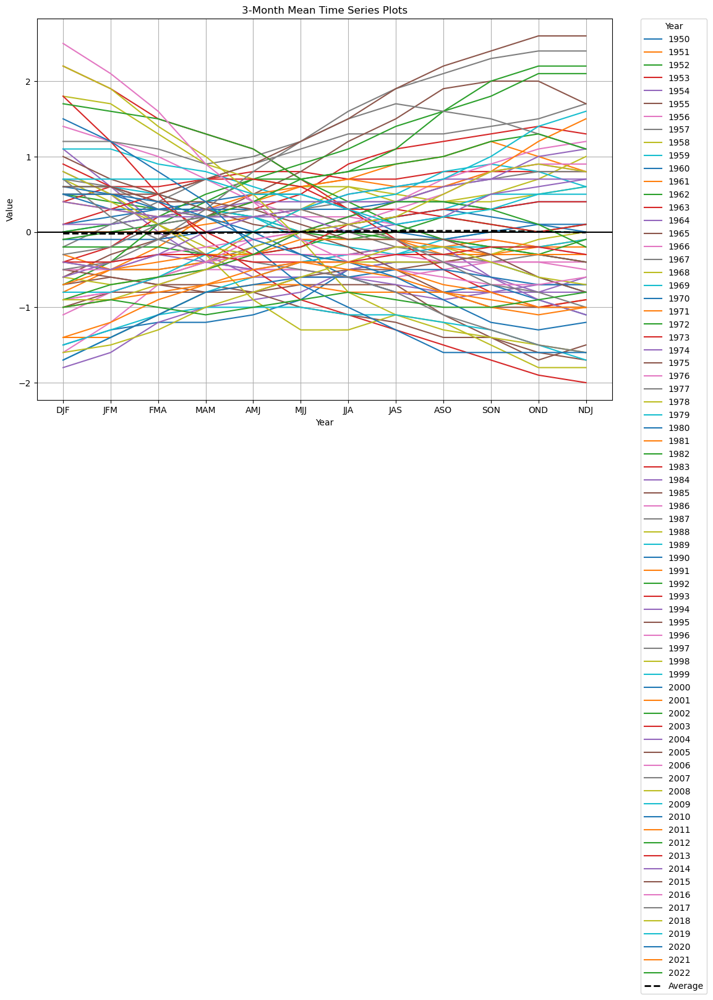

In [202]:
import pandas as pd
import matplotlib.pyplot as plt

years = df2['Year']
plt.figure(figsize=(12, 8)) 
for column in df2.columns[1:]:
    plt.plot(years, df2[column], label=column)

average_line = df2.iloc[:, 1:].mean(axis=1)
plt.plot(years, average_line, label='Average', linewidth=2, linestyle='--', color = 'black')

plt.axhline(y=0, color = 'black')
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('3-Month Mean Time Series Plots')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Year')
plt.grid(True)

plt.show()


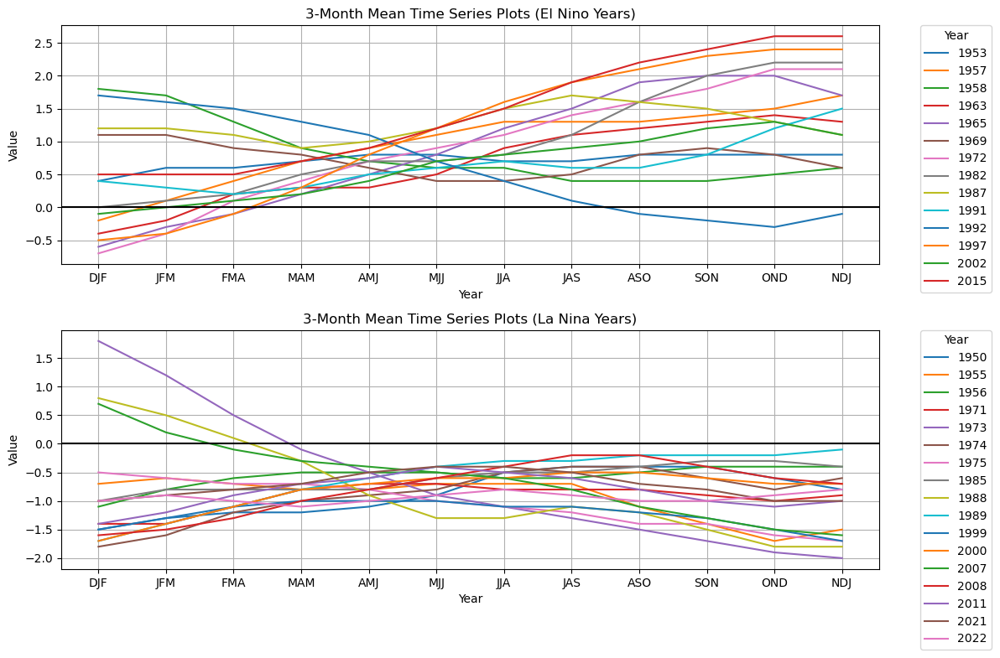

In [203]:
import pandas as pd
import matplotlib.pyplot as plt

years = df2['Year']
plt.figure(figsize=(12, 8)) 

# Plotting columns with columnar mean > 0.5
plt.subplot(2, 1, 1)
plt.title('3-Month Mean Time Series Plots (El Nino Years)')
for column in df2.columns[1:]:
    if df2[column].mean() > 0.5:
        plt.plot(years, df2[column], label=column)
plt.axhline(y=0, color='black')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Year')
plt.grid(True)

# Plotting columns with columnar mean < -0.5
plt.subplot(2, 1, 2)
plt.title('3-Month Mean Time Series Plots (La Nina Years)')
for column in df2.columns[1:]:
    if df2[column].mean() < -0.5:
        plt.plot(years, df2[column], label=column)
plt.axhline(y=0, color='black')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Year')
plt.grid(True)

plt.tight_layout()
plt.show()


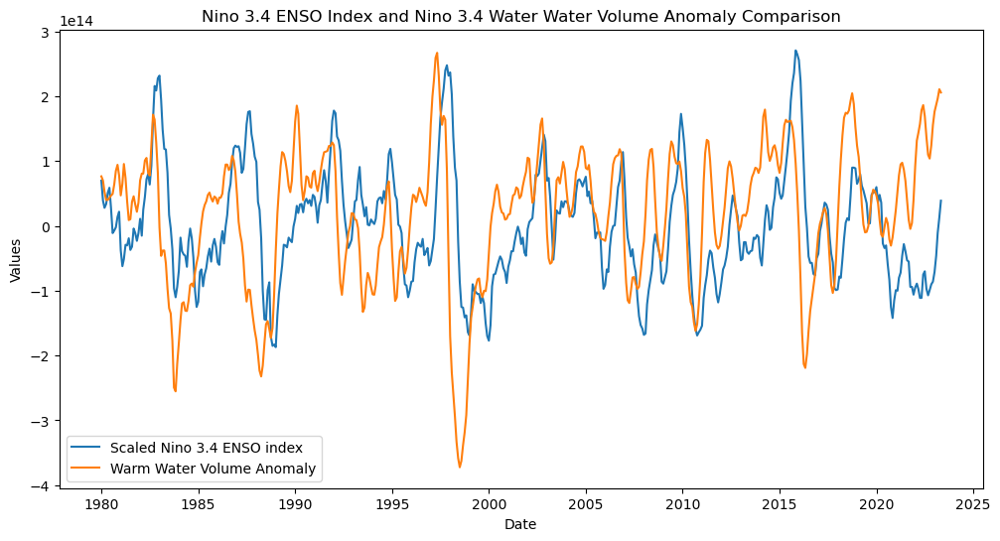

Max correlation lag: -5


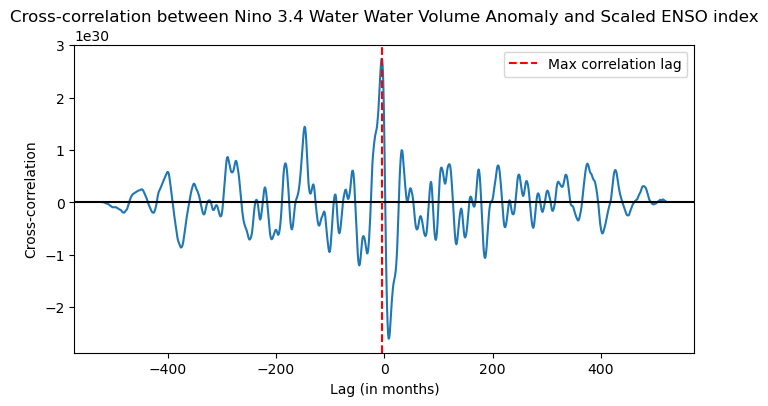

Max positive correlation: 2.74090414227381e+30
Max negative correlation: -2.60321180275552e+30


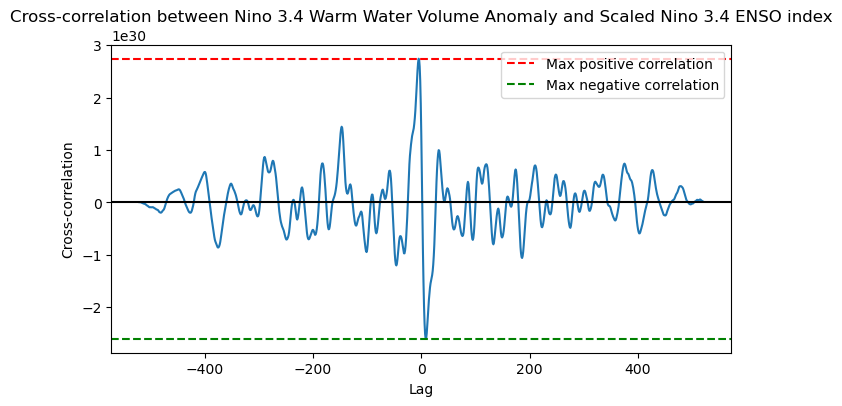

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])

plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df['Scaled ENSO index'], label='Scaled Nino 3.4 ENSO index')
plt.plot(df['Date'], df['Anomaly'], label='Warm Water Volume Anomaly')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Nino 3.4 ENSO Index and Nino 3.4 Water Water Volume Anomaly Comparison')
plt.legend()
plt.show()

cross_corr = np.correlate(df['Anomaly'], df['Scaled ENSO index'], mode='full')

max_corr_lag = np.argmax(cross_corr) - (len(df) - 1)

print("Max correlation lag:", max_corr_lag)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df)+1, len(df)), cross_corr)
plt.xlabel('Lag (in months)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Nino 3.4 Water Water Volume Anomaly and Scaled ENSO index')
plt.axhline(y=0, color = 'black')
plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
plt.legend()
plt.show()

max_positive_corr_lag = np.argmax(cross_corr)
max_negative_corr_lag = np.argmin(cross_corr)

max_positive_corr = cross_corr[max_positive_corr_lag]
max_negative_corr = cross_corr[max_negative_corr_lag]

print("Max positive correlation:", max_positive_corr)
print("Max negative correlation:", max_negative_corr)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df)+1, len(df)), cross_corr)
plt.xlabel('Lag')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Nino 3.4 Warm Water Volume Anomaly and Scaled Nino 3.4 ENSO index')
plt.axhline(y=0, color = 'black')
plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
plt.legend()
plt.show()


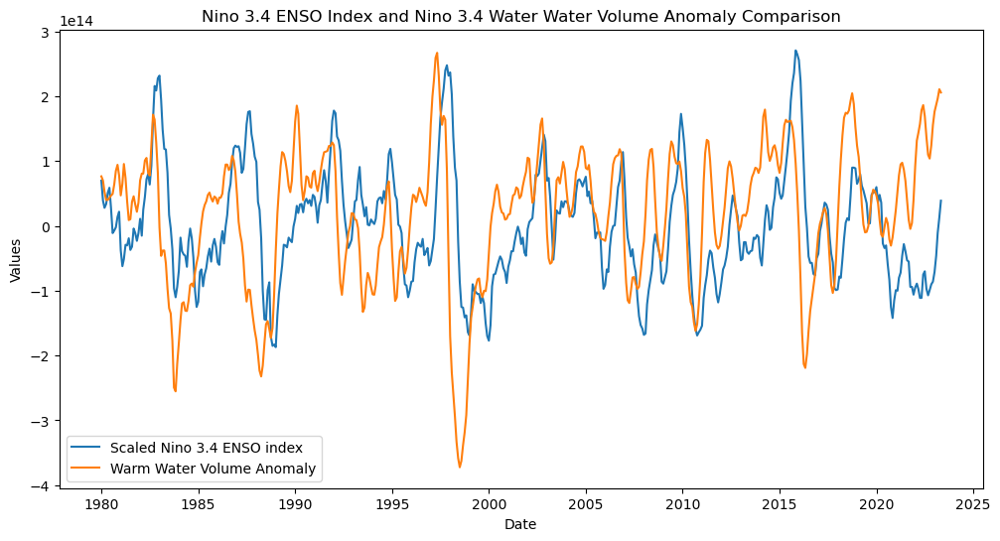

Max correlation lag: -5


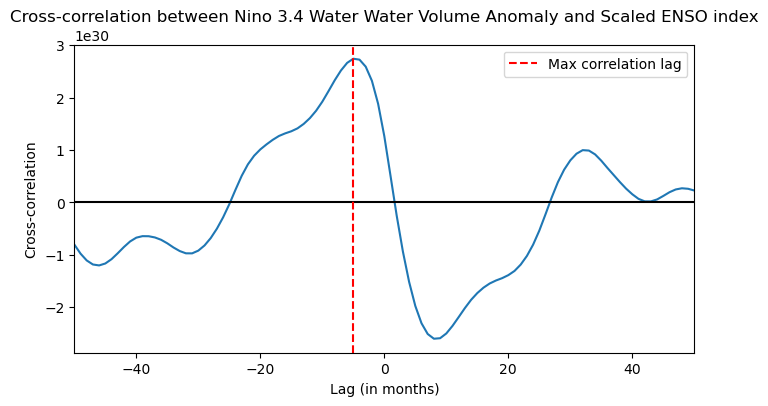

Max positive correlation: 2.74090414227381e+30
Max negative correlation: -2.60321180275552e+30


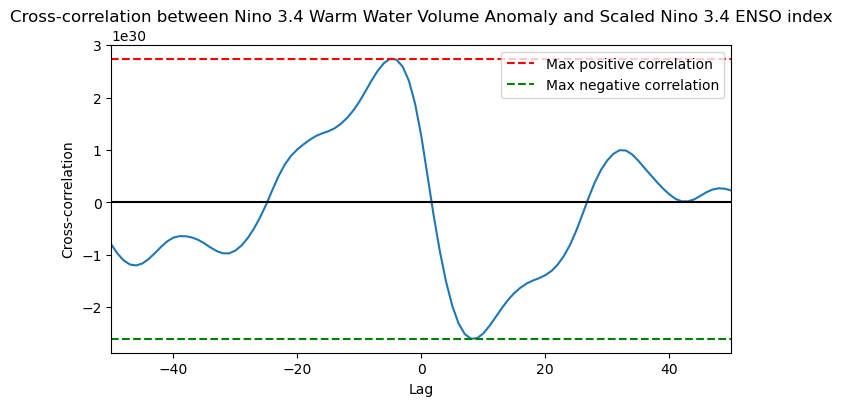

In [205]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])

plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df['Scaled ENSO index'], label='Scaled Nino 3.4 ENSO index')
plt.plot(df['Date'], df['Anomaly'], label='Warm Water Volume Anomaly')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Nino 3.4 ENSO Index and Nino 3.4 Water Water Volume Anomaly Comparison')
plt.legend()
plt.show()

cross_corr = np.correlate(df['Anomaly'], df['Scaled ENSO index'], mode='full')

max_corr_lag = np.argmax(cross_corr) - (len(df) - 1)

print("Max correlation lag:", max_corr_lag)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df)+1, len(df)), cross_corr)
plt.xlabel('Lag (in months)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Nino 3.4 Water Water Volume Anomaly and Scaled ENSO index')
plt.axhline(y=0, color='black')
plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
plt.xlim(-50, 50)  # Set the x-axis limits to -50 and +50
plt.legend()
plt.show()

max_positive_corr_lag = np.argmax(cross_corr)
max_negative_corr_lag = np.argmin(cross_corr)

max_positive_corr = cross_corr[max_positive_corr_lag]
max_negative_corr = cross_corr[max_negative_corr_lag]

print("Max positive correlation:", max_positive_corr)
print("Max negative correlation:", max_negative_corr)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df)+1, len(df)), cross_corr)
plt.xlabel('Lag')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Nino 3.4 Warm Water Volume Anomaly and Scaled Nino 3.4 ENSO index')
plt.axhline(y=0, color='black')
plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
plt.xlim(-50, 50)  # Set the x-axis limits to -50 and +50
plt.legend()
plt.show()


In [206]:
df3 = pd.read_excel('ENSO.xlsx')
df3.head()

,Year,DJF,JFM,FMA,MAM,AMJ,MJJ,JJA,JAS,ASO,SON,OND,NDJ
0,1950,-1.5,-1.3,-1.2,-1.2,-1.1,-0.9,-0.5,-0.4,-0.4,-0.4,-0.6,-0.8
1,1951,-0.8,-0.5,-0.2,0.2,0.4,0.6,0.7,0.9,1.0,1.2,1.0,0.8
2,1952,0.5,0.4,0.3,0.3,0.2,0.0,-0.1,0.0,0.2,0.1,0.0,0.1
3,1953,0.4,0.6,0.6,0.7,0.8,0.8,0.7,0.7,0.8,0.8,0.8,0.8
4,1954,0.8,0.5,0.0,-0.4,-0.5,-0.5,-0.6,-0.8,-0.9,-0.8,-0.7,-0.7


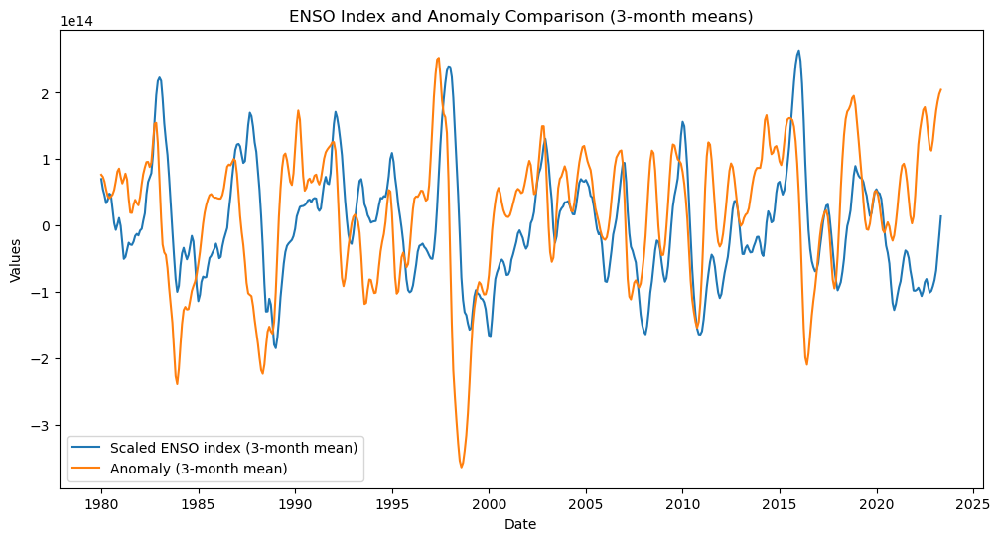

Max correlation lag: -5


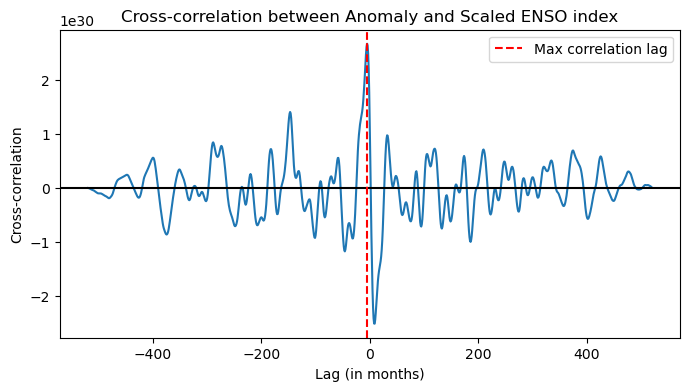

Max positive correlation: 2.676008202088112e+30
Max negative correlation: -2.5163086652633245e+30


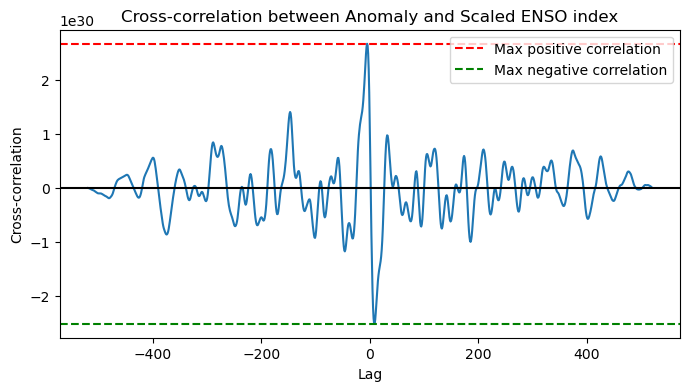

In [207]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


df['Date'] = pd.to_datetime(df['Date'])

rolling_means = df[['Scaled ENSO index', 'Anomaly']].rolling(window=3, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(df['Date'], rolling_means['Scaled ENSO index'], label='Scaled ENSO index (3-month mean)')
plt.plot(df['Date'], rolling_means['Anomaly'], label='Anomaly (3-month mean)')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('ENSO Index and Anomaly Comparison (3-month means)')
plt.legend()
plt.show()

cross_corr = np.correlate(rolling_means['Anomaly'], rolling_means['Scaled ENSO index'], mode='full')

max_corr_lag = np.argmax(cross_corr) - (len(df) - 1)

print("Max correlation lag:", max_corr_lag)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df) + 1, len(df)), cross_corr)
plt.xlabel('Lag (in months)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Anomaly and Scaled ENSO index')
plt.axhline(y=0, color='black')
plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
plt.legend()
plt.show()

max_positive_corr_lag = np.argmax(cross_corr)
max_negative_corr_lag = np.argmin(cross_corr)

max_positive_corr = cross_corr[max_positive_corr_lag]
max_negative_corr = cross_corr[max_negative_corr_lag]

print("Max positive correlation:", max_positive_corr)
print("Max negative correlation:", max_negative_corr)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(df) + 1, len(df)), cross_corr)
plt.xlabel('Lag')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Anomaly and Scaled ENSO index')
plt.axhline(y=0, color='black')
plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
plt.legend()
plt.show()


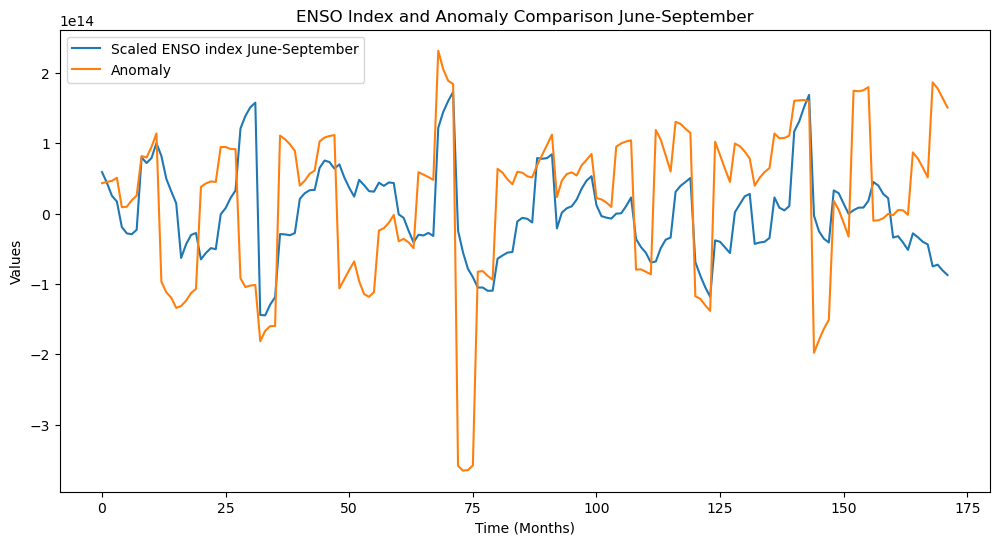

Max correlation lag: -2


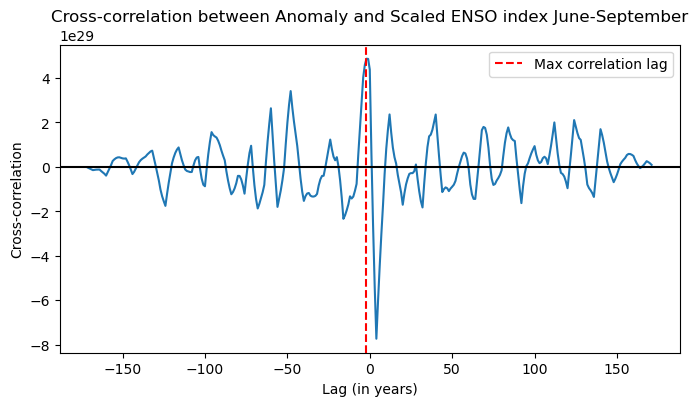

Max positive correlation: 4.867850744459917e+29
Max negative correlation: -7.736719516493548e+29


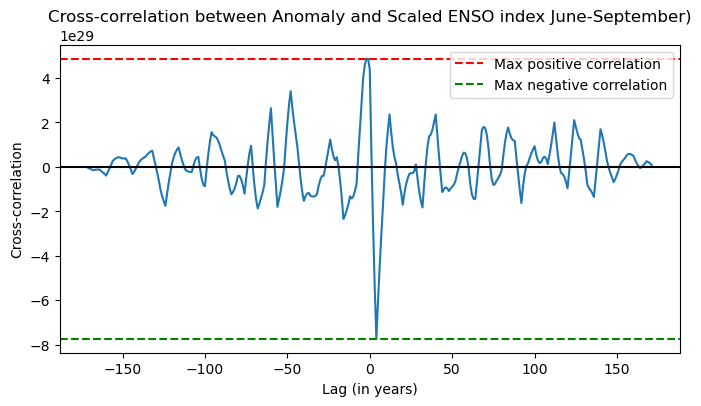

In [208]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])

df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

filtered_df = df[(df['Month'] >= 6) & (df['Month'] <= 9)]

rolling_means = filtered_df.groupby('Year')[['Scaled ENSO index', 'Anomaly']].rolling(window=4, min_periods=1).mean()

rolling_means.reset_index(inplace=True, drop=True)

plt.figure(figsize=(12, 6))
plt.plot(rolling_means.index, rolling_means['Scaled ENSO index'], label='Scaled ENSO index June-September')
plt.plot(rolling_means.index, rolling_means['Anomaly'], label='Anomaly')
plt.xlabel('Time (Months)')
plt.ylabel('Values')
plt.title('ENSO Index and Anomaly Comparison June-September')
plt.legend()
plt.show()

cross_corr = np.correlate(rolling_means['Anomaly'], rolling_means['Scaled ENSO index'], mode='full')

max_corr_lag = np.argmax(cross_corr) - (len(rolling_means) - 1)

print("Max correlation lag:", max_corr_lag)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
plt.xlabel('Lag (in years)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Anomaly and Scaled ENSO index June-September')
plt.axhline(y=0, color='black')
plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
plt.legend()
plt.show()

max_positive_corr_lag = np.argmax(cross_corr)
max_negative_corr_lag = np.argmin(cross_corr)

max_positive_corr = cross_corr[max_positive_corr_lag]
max_negative_corr = cross_corr[max_negative_corr_lag]

print("Max positive correlation:", max_positive_corr)
print("Max negative correlation:", max_negative_corr)

plt.figure(figsize=(8, 4))
plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
plt.xlabel('Lag (in years)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Anomaly and Scaled ENSO index June-September)')
plt.axhline(y=0, color='black')
plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
plt.legend()
plt.show()


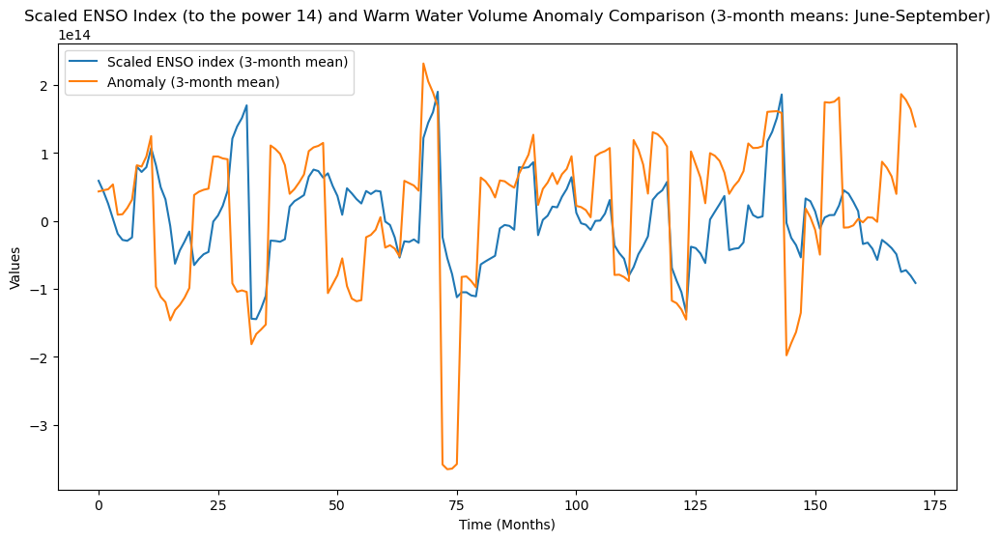

Max correlation lag: -1


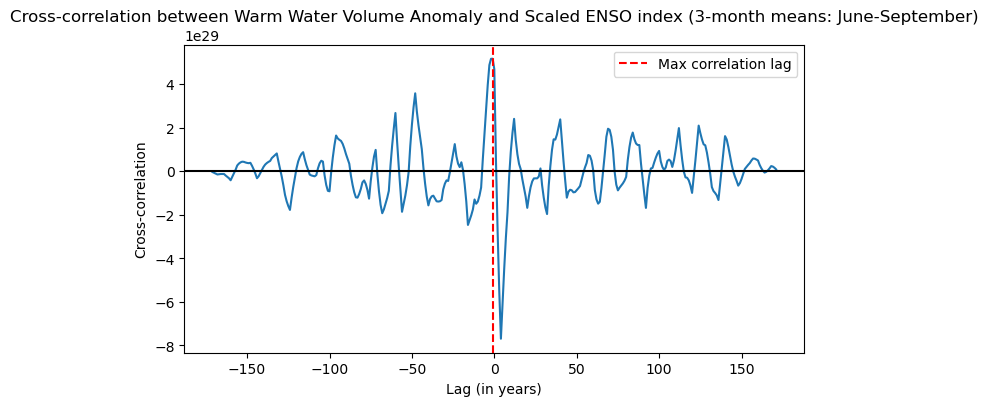

Max positive correlation: 5.166422365525889e+29
Max negative correlation: -7.697087331060333e+29


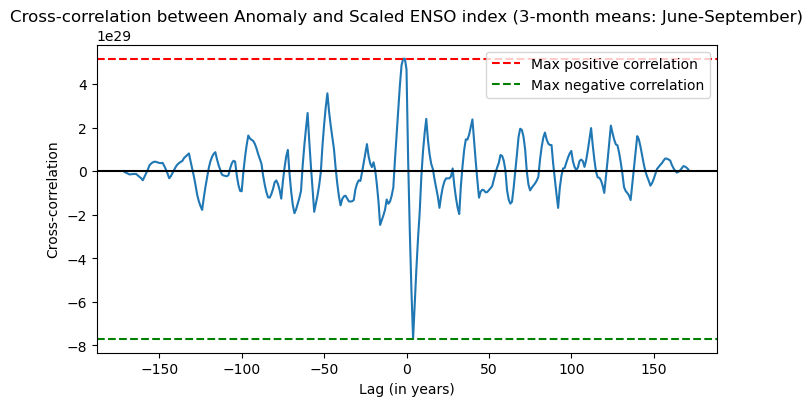

In [209]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Convert 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract the month and year from the 'Date' column
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

# Filter the data for the months June, July, August, and September
filtered_df = df[(df['Month'] >= 6) & (df['Month'] <= 9)]

# Calculate three-month rolling means for 'Scaled ENSO index' and 'Anomaly' columns
rolling_means = filtered_df.groupby('Year')[['Scaled ENSO index', 'Anomaly']].rolling(window=3, min_periods=1).mean()

# Reset index to remove the multi-level index created by groupby and rolling
rolling_means.reset_index(inplace=True, drop=True)

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(rolling_means.index, rolling_means['Scaled ENSO index'], label='Scaled ENSO index (3-month mean)')
plt.plot(rolling_means.index, rolling_means['Anomaly'], label='Anomaly (3-month mean)')
plt.xlabel('Time (Months)')
plt.ylabel('Values')
plt.title('Scaled ENSO Index (to the power 14) and Warm Water Volume Anomaly Comparison (3-month means: June-September)')
plt.legend()
plt.show()

# Calculate cross-correlation
cross_corr = np.correlate(rolling_means['Anomaly'], rolling_means['Scaled ENSO index'], mode='full')

# Find the maximum correlation lag
max_corr_lag = np.argmax(cross_corr) - (len(rolling_means) - 1)

print("Max correlation lag:", max_corr_lag)

# Plot the cross-correlation
plt.figure(figsize=(8, 4))
plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
plt.xlabel('Lag (in years)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Warm Water Volume Anomaly and Scaled ENSO index (3-month means: June-September)')
plt.axhline(y=0, color='black')
plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
plt.legend()
plt.show()

# Find the maximum positive and negative correlations
max_positive_corr_lag = np.argmax(cross_corr)
max_negative_corr_lag = np.argmin(cross_corr)

max_positive_corr = cross_corr[max_positive_corr_lag]
max_negative_corr = cross_corr[max_negative_corr_lag]

print("Max positive correlation:", max_positive_corr)
print("Max negative correlation:", max_negative_corr)

# Plot the cross-correlation with max positive and negative correlations
plt.figure(figsize=(8, 4))
plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
plt.xlabel('Lag (in years)')
plt.ylabel('Cross-correlation')
plt.title('Cross-correlation between Anomaly and Scaled ENSO index (3-month means: June-September)')
plt.axhline(y=0, color='black')
plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
plt.legend()
plt.show()


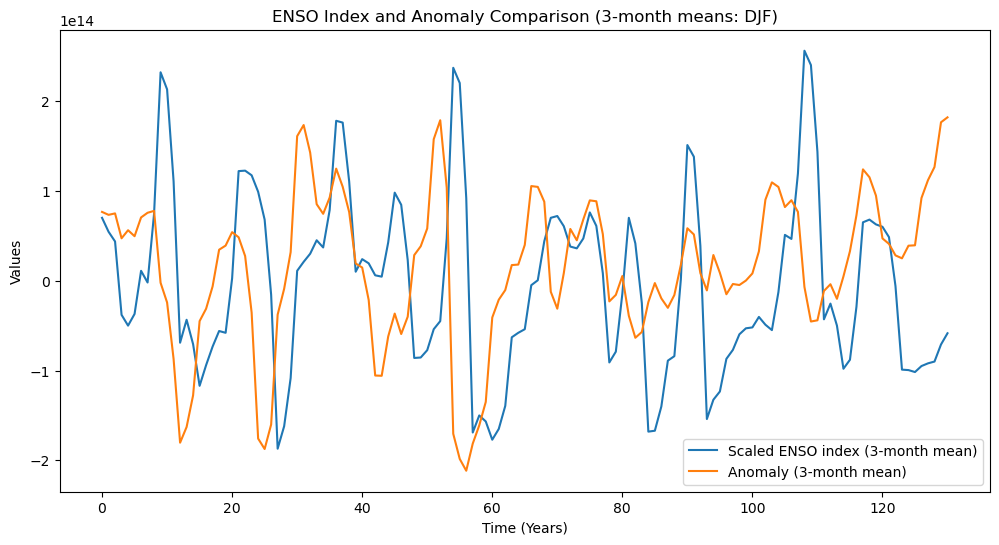

Max correlation lag: -3


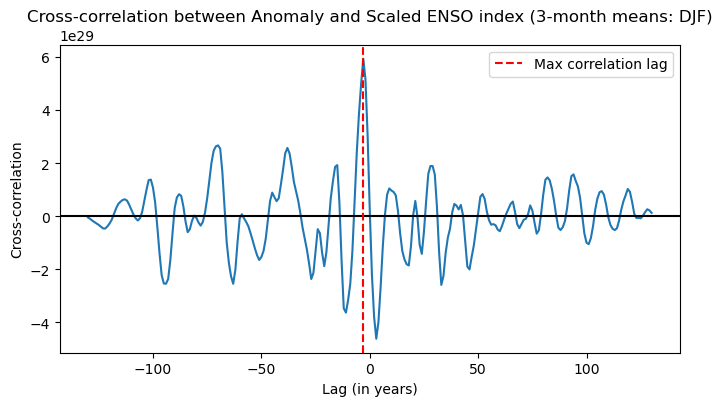

Max positive correlation: 5.942378157085056e+29
Max negative correlation: -4.6188807397464445e+29


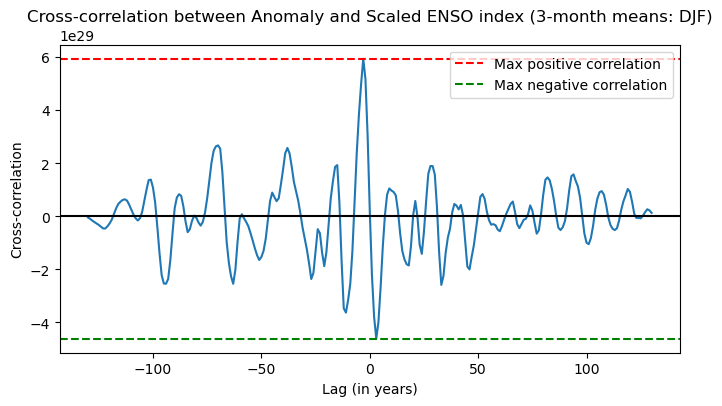

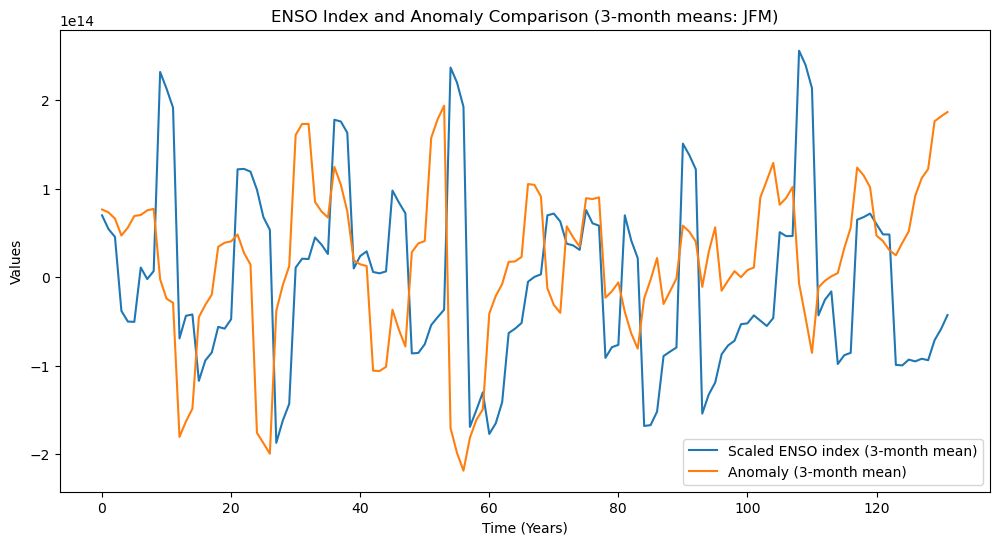

Max correlation lag: -3


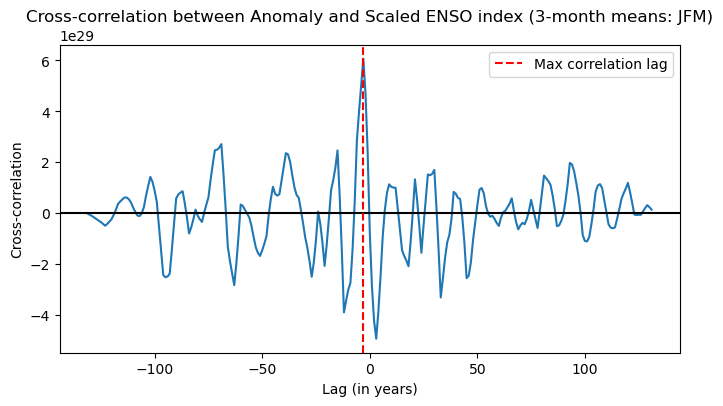

Max positive correlation: 6.0640252886717225e+29
Max negative correlation: -4.941179206135111e+29


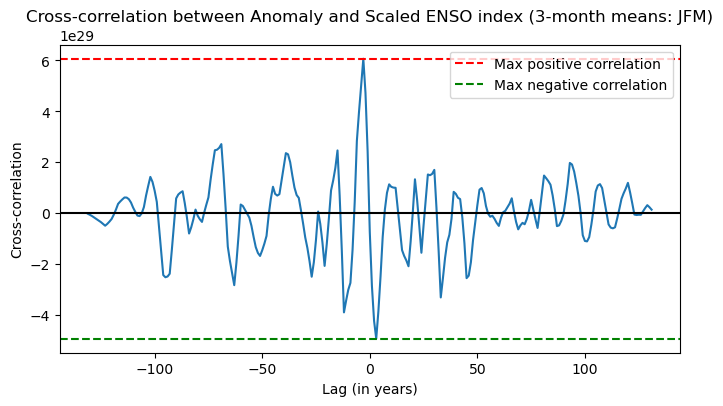

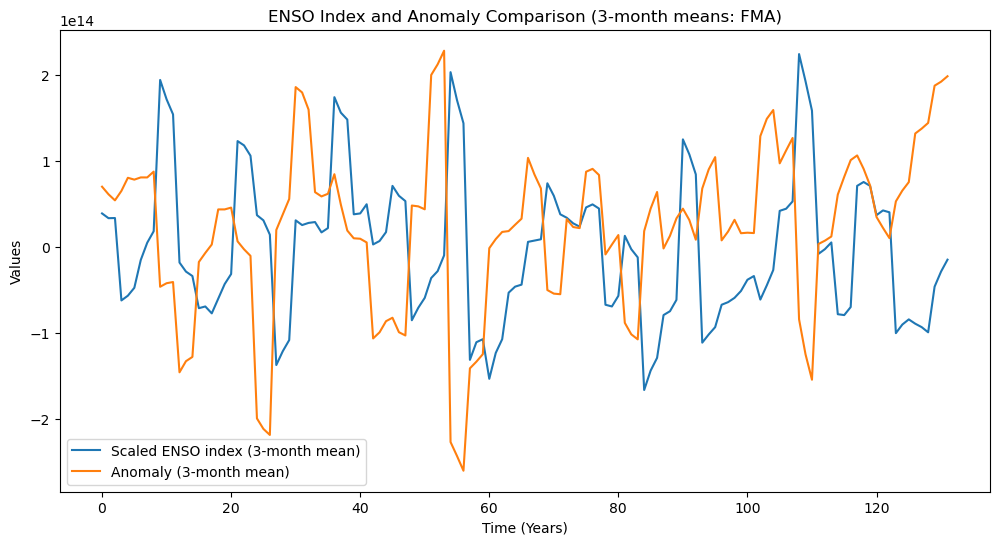

Max correlation lag: -3


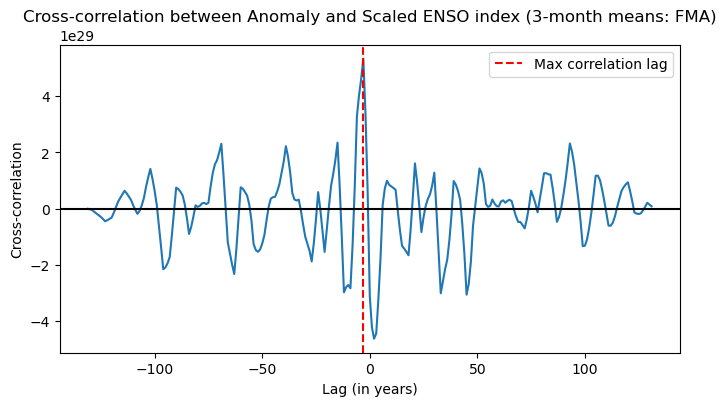

Max positive correlation: 5.3264464095511104e+29
Max negative correlation: -4.630531720473333e+29


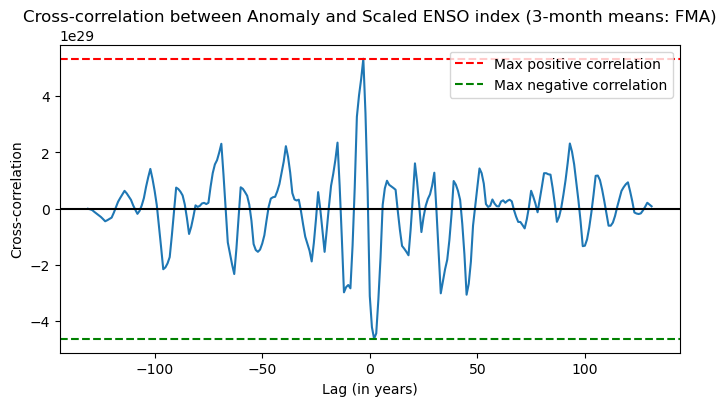

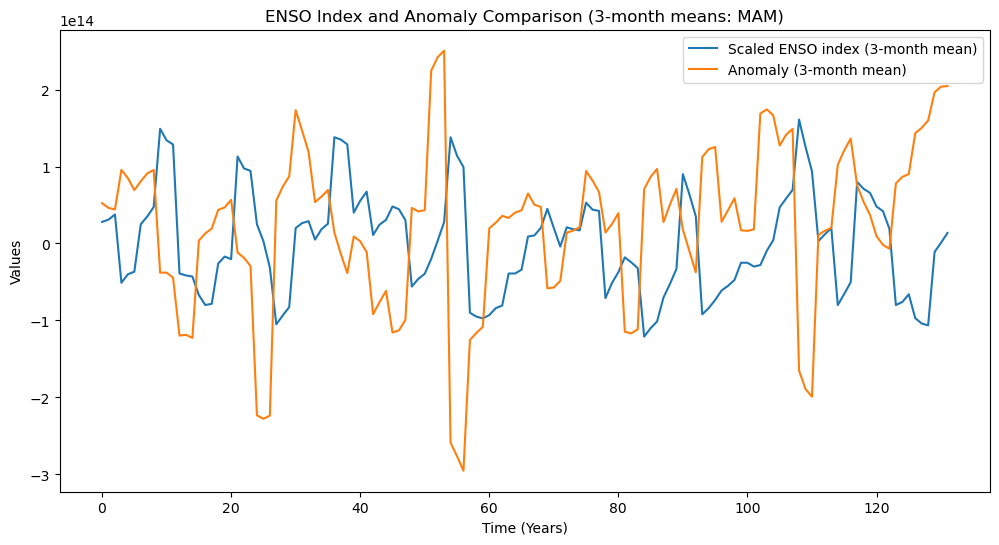

Max correlation lag: -3


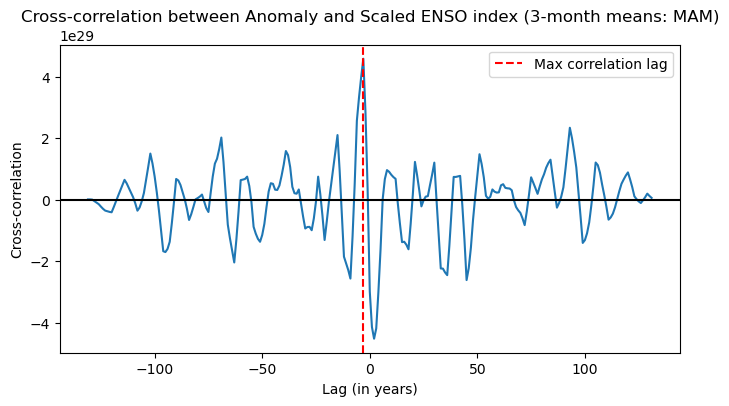

Max positive correlation: 4.5779102451605554e+29
Max negative correlation: -4.518144182824999e+29


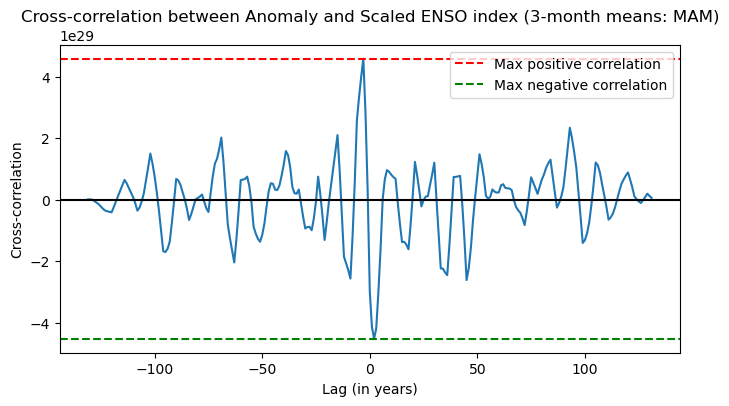

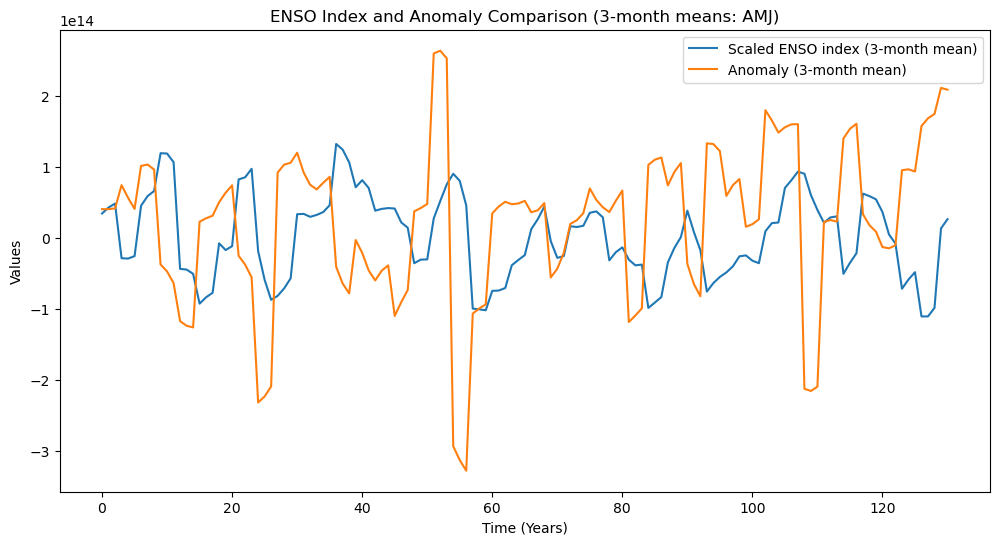

Max correlation lag: -3


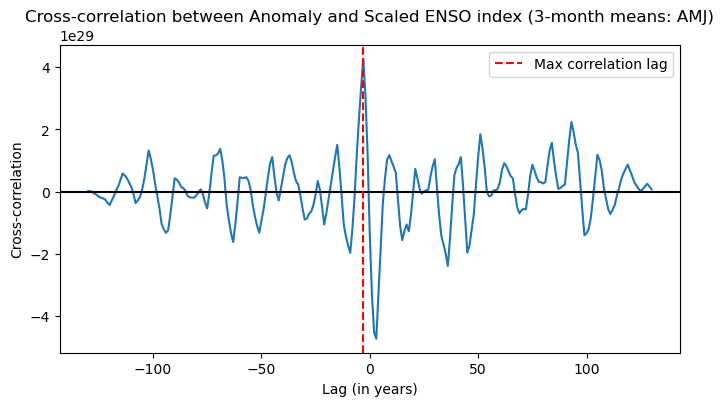

Max positive correlation: 4.2648505314625e+29
Max negative correlation: -4.725862463870833e+29


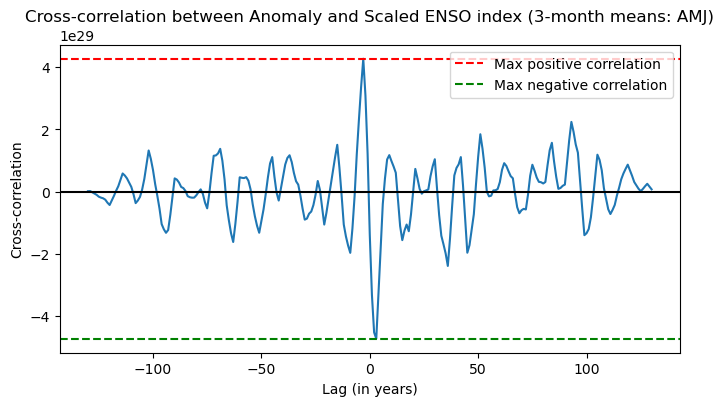

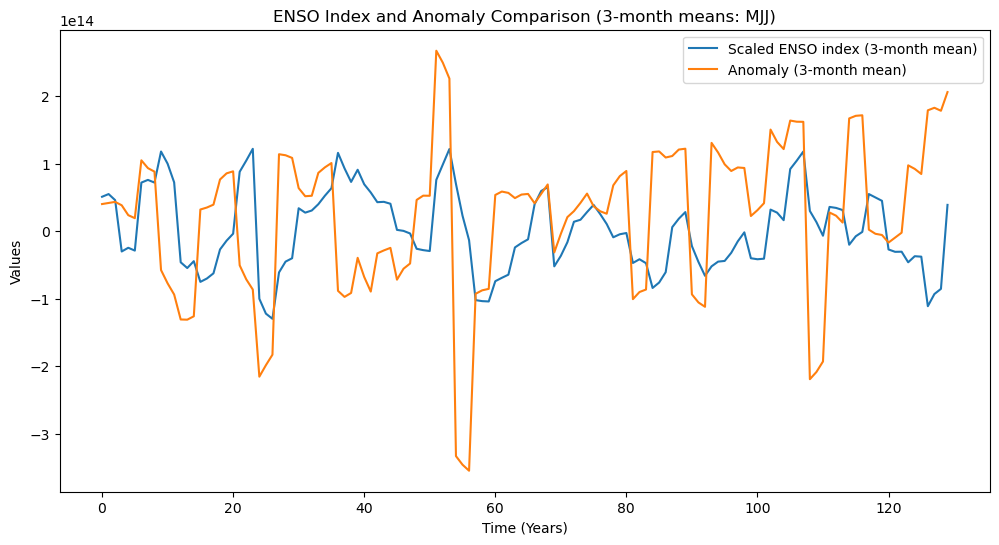

Max correlation lag: -3


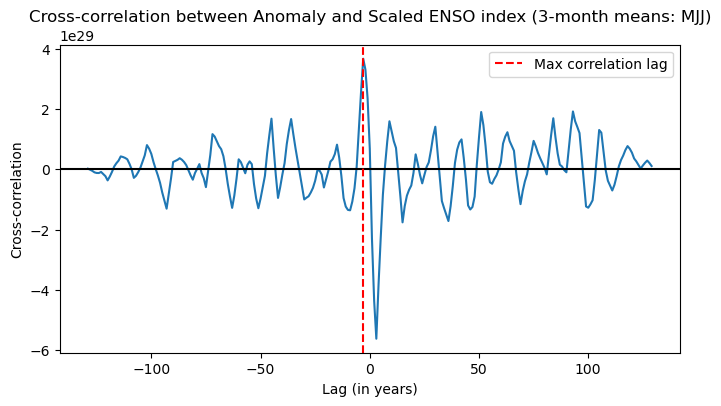

Max positive correlation: 3.662486329924444e+29
Max negative correlation: -5.6212321684416665e+29


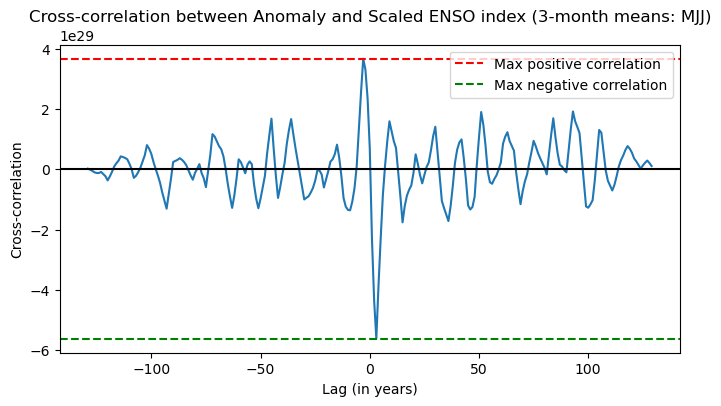

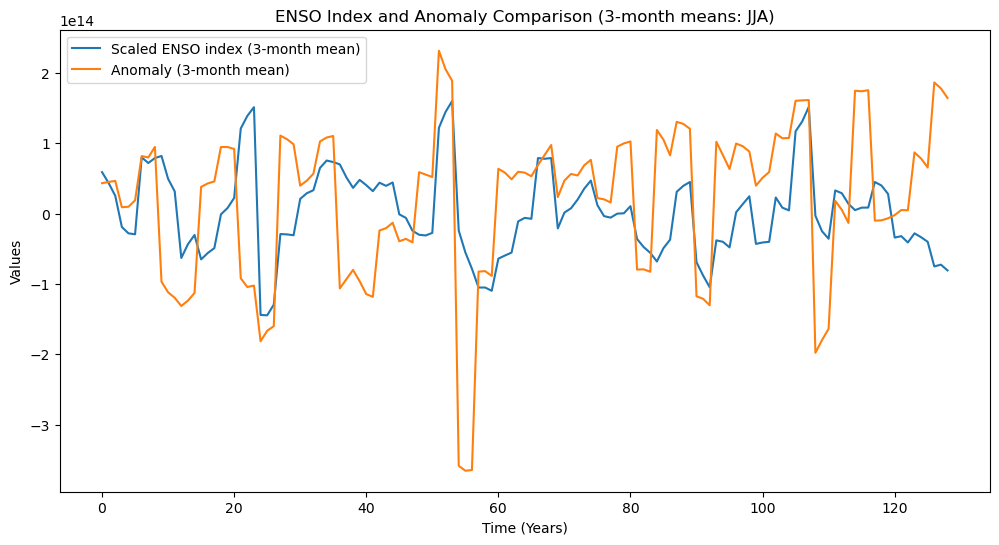

Max correlation lag: -2


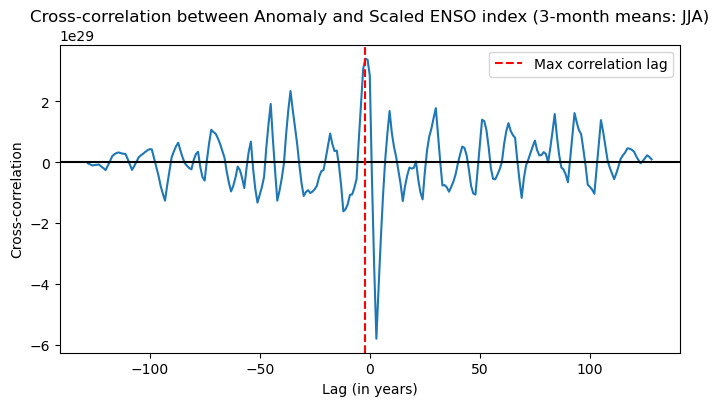

Max positive correlation: 3.4006879997829996e+29
Max negative correlation: -5.7937602761341114e+29


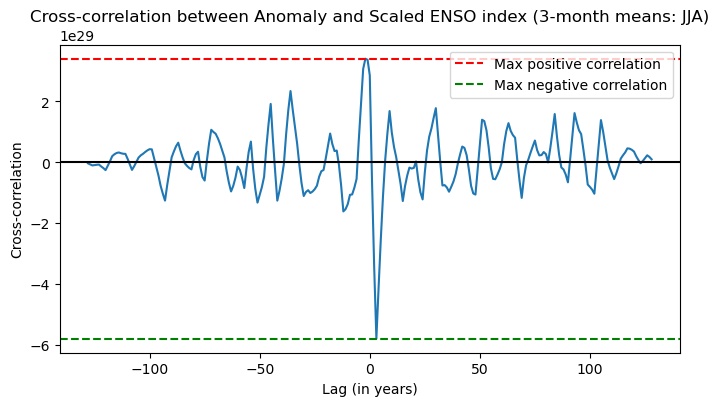

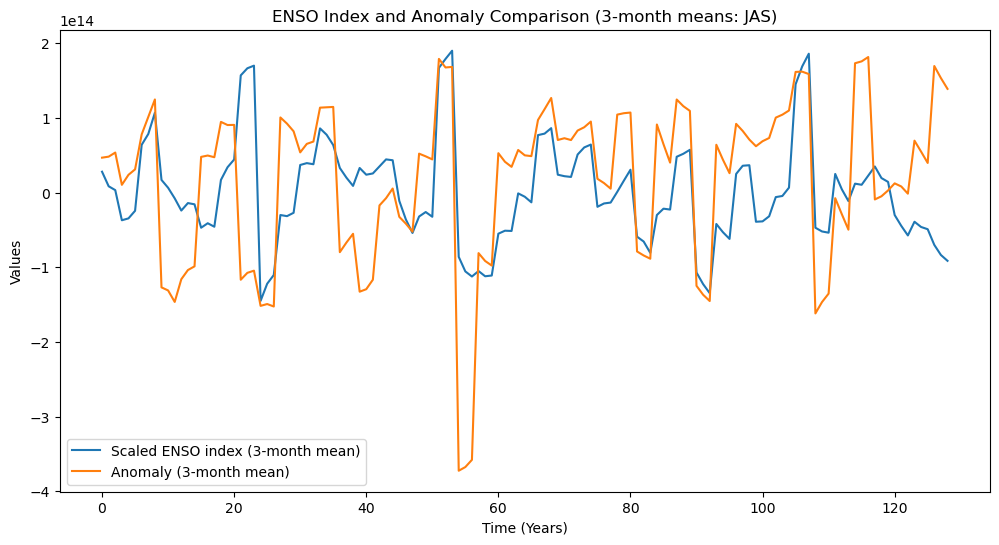

Max correlation lag: 0


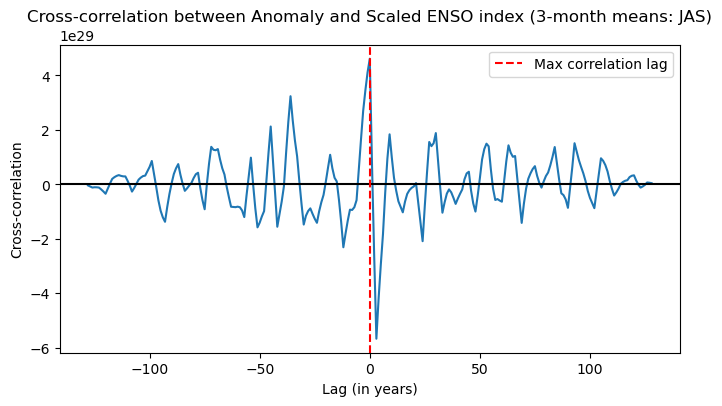

Max positive correlation: 4.611564887949417e+29
Max negative correlation: -5.676152840517972e+29


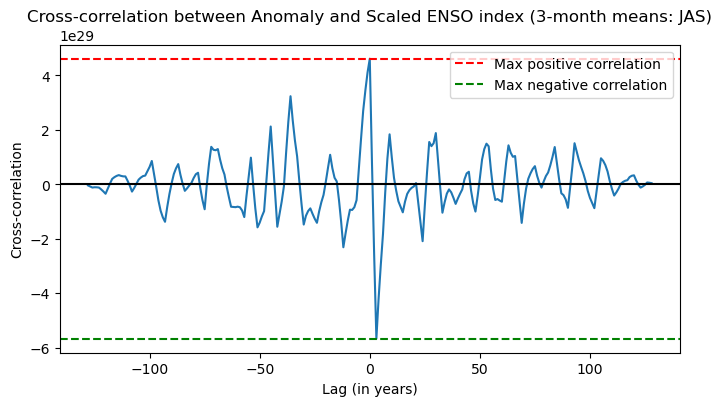

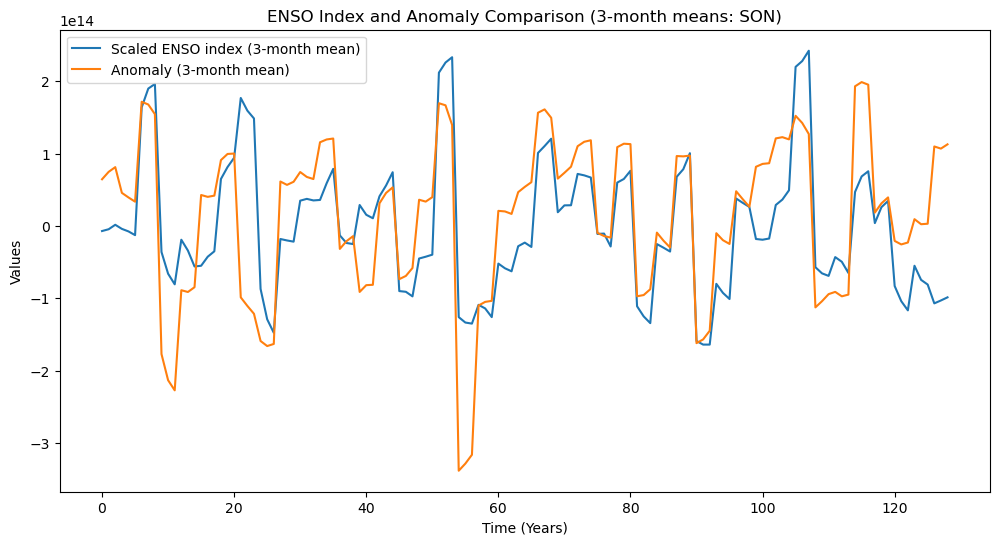

Max correlation lag: 0


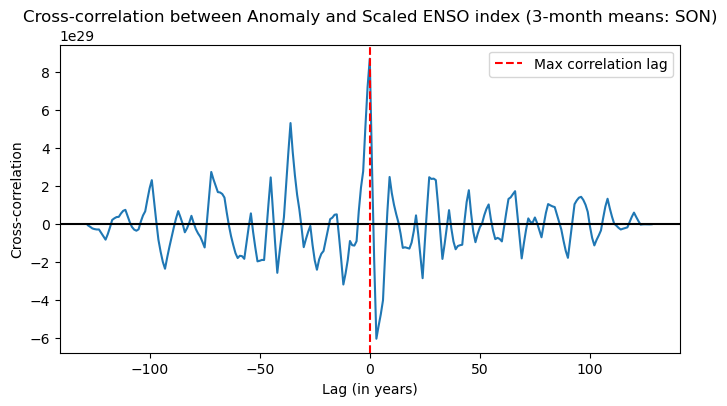

Max positive correlation: 8.707363925951388e+29
Max negative correlation: -6.032849791780145e+29


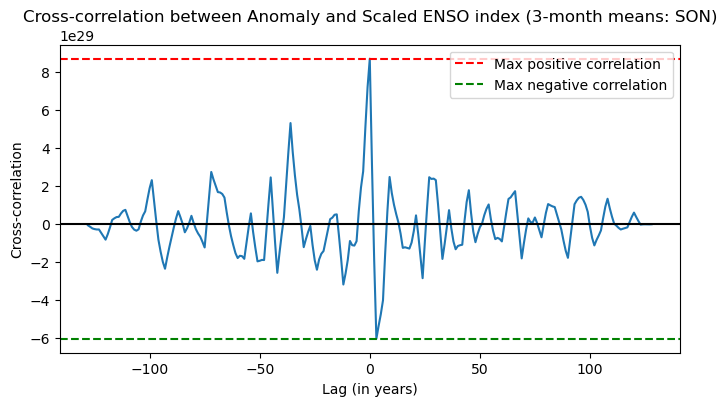

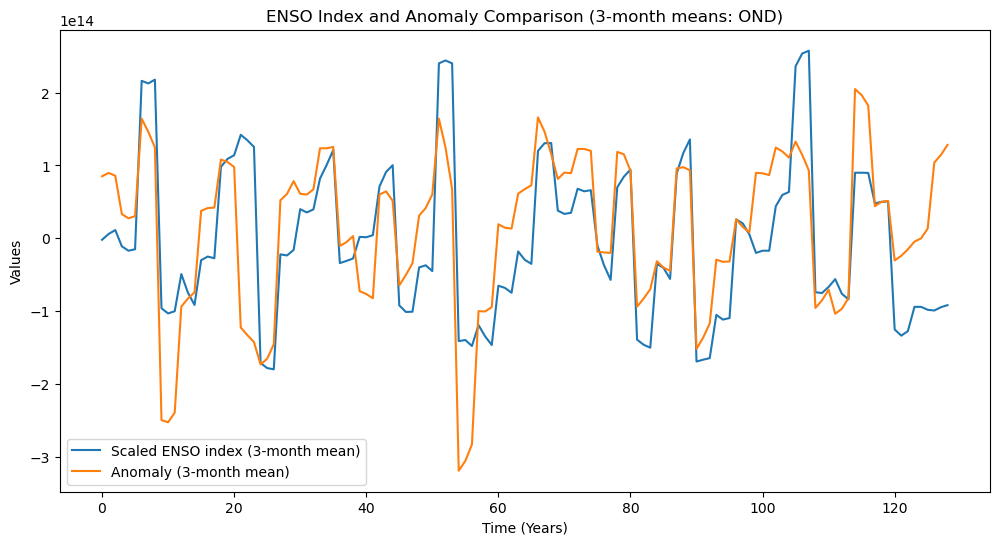

Max correlation lag: 0


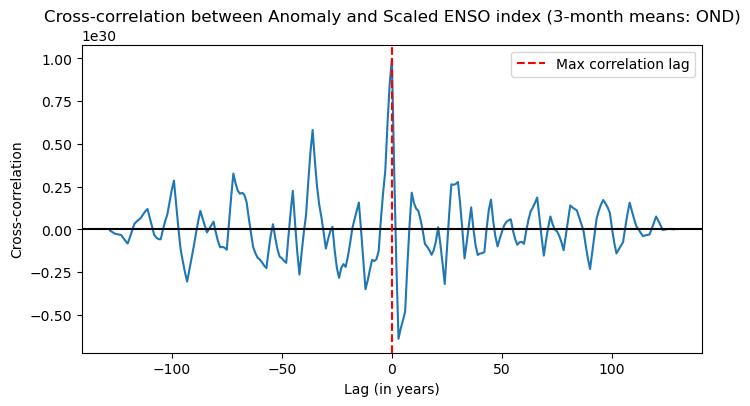

Max positive correlation: 9.981445007128083e+29
Max negative correlation: -6.409764088853164e+29


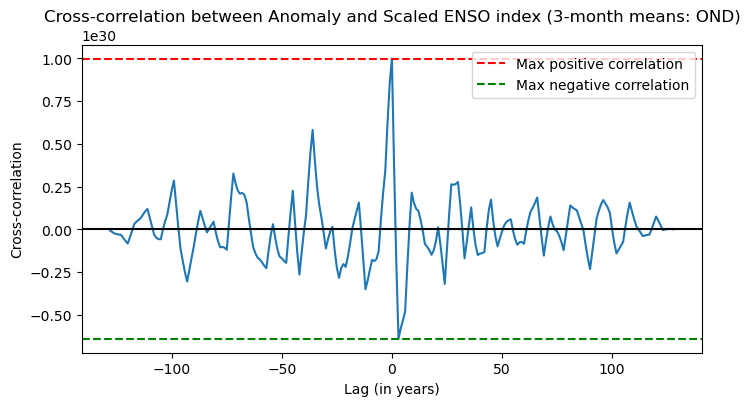

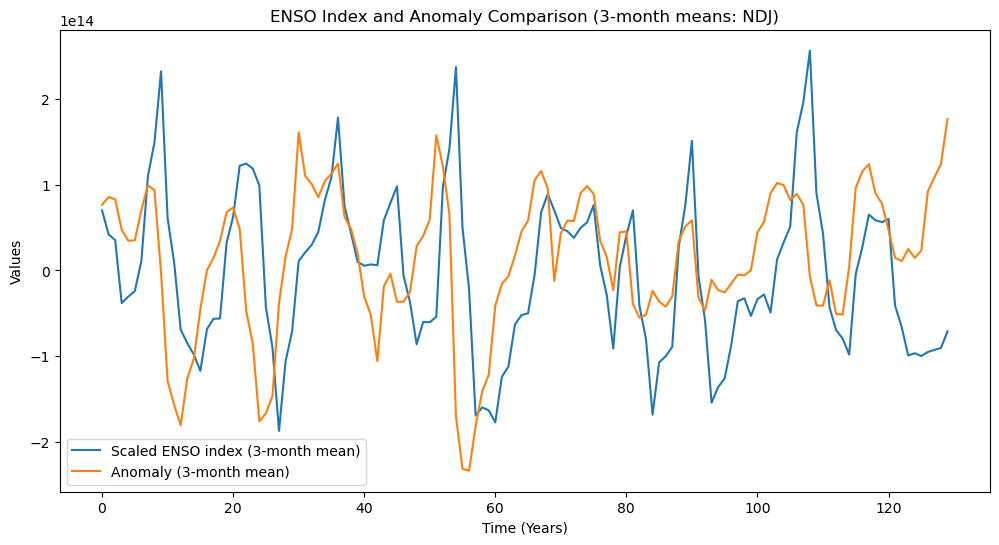

Max correlation lag: -2


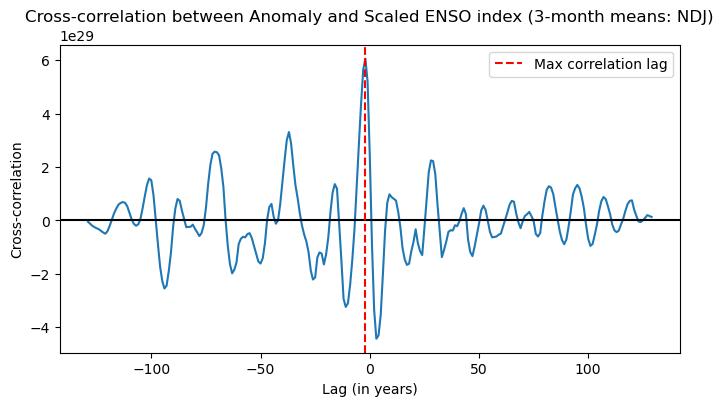

Max positive correlation: 6.05274943662285e+29
Max negative correlation: -4.438806891415167e+29


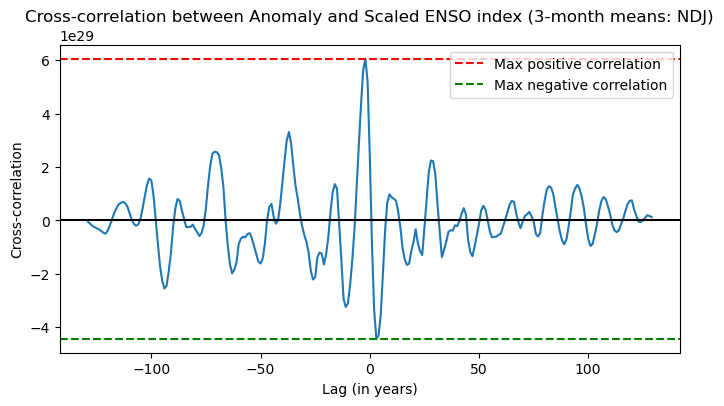

In [210]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


df['Date'] = pd.to_datetime(df['Date'])


seasons = {
    'DJF': [12, 1, 2],
    'JFM': [1, 2, 3],
    'FMA': [2, 3, 4],
    'MAM': [3, 4, 5],
    'AMJ': [4, 5, 6],
    'MJJ': [5, 6, 7],
    'JJA': [6, 7, 8],
    'JAS': [7, 8, 9],
    'SON': [9, 10, 11],
    'OND': [10, 11, 12],
    'NDJ': [11, 12, 1]
}

for season, months in seasons.items():
    filtered_df = df[df['Date'].dt.month.isin(months)]

 
    rolling_means = filtered_df.groupby(filtered_df['Date'].dt.year)[['Scaled ENSO index', 'Anomaly']].rolling(window=3, min_periods=1).mean()
    rolling_means.reset_index(inplace=True, drop=True)

    plt.figure(figsize=(12, 6))
    plt.plot(rolling_means.index, rolling_means['Scaled ENSO index'], label='Scaled ENSO index (3-month mean)')
    plt.plot(rolling_means.index, rolling_means['Anomaly'], label='Anomaly (3-month mean)')
    plt.xlabel('Time (Years)')
    plt.ylabel('Values')
    plt.title(f'ENSO Index and Anomaly Comparison (3-month means: {season})')
    plt.legend()
    plt.show()

    cross_corr = np.correlate(rolling_means['Anomaly'], rolling_means['Scaled ENSO index'], mode='full')

    max_corr_lag = np.argmax(cross_corr) - (len(rolling_means) - 1)

    print("Max correlation lag:", max_corr_lag)

    plt.figure(figsize=(8, 4))
    plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
    plt.xlabel('Lag (in years)')
    plt.ylabel('Cross-correlation')
    plt.title(f'Cross-correlation between Anomaly and Scaled ENSO index (3-month means: {season})')
    plt.axhline(y=0, color='black')
    plt.axvline(x=max_corr_lag, color='r', linestyle='--', label='Max correlation lag')
    plt.legend()
    plt.show()

    max_positive_corr_lag = np.argmax(cross_corr)
    max_negative_corr_lag = np.argmin(cross_corr)

    max_positive_corr = cross_corr[max_positive_corr_lag]
    max_negative_corr = cross_corr[max_negative_corr_lag]

    print("Max positive correlation:", max_positive_corr)
    print("Max negative correlation:", max_negative_corr)

    plt.figure(figsize=(8, 4))
    plt.plot(range(-len(rolling_means) + 1, len(rolling_means)), cross_corr)
    plt.xlabel('Lag (in years)')
    plt.ylabel('Cross-correlation')
    plt.title(f'Cross-correlation between Anomaly and Scaled ENSO index (3-month means: {season})')
    plt.axhline(y=0, color='black')
    plt.axhline(y=max_positive_corr, color='r', linestyle='--', label='Max positive correlation')
    plt.axhline(y=max_negative_corr, color='g', linestyle='--', label='Max negative correlation')
    plt.legend()
    plt.show()


In [211]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])
seasons = {
    'DJF': [12, 1, 2],
    'JFM': [1, 2, 3],
    'FMA': [2, 3, 4],
    'MAM': [3, 4, 5],
    'AMJ': [4, 5, 6],
    'MJJ': [5, 6, 7],
    'JJA': [6, 7, 8],
    'JAS': [7, 8, 9],
    'SON': [9, 10, 11],
    'OND': [10, 11, 12],
    'NDJ': [11, 12, 1]
}

results = []

for season, months in seasons.items():
   
    filtered_df = df[df['Date'].dt.month.isin(months)]
    rolling_means = filtered_df.groupby(filtered_df['Date'].dt.year)[['Scaled ENSO index', 'Anomaly']].rolling(window=3, min_periods=1).mean()
    rolling_means.reset_index(inplace=True, drop=True)
    cross_corr = np.correlate(rolling_means['Anomaly'], rolling_means['Scaled ENSO index'], mode='full')
    max_corr_lag = np.argmax(cross_corr) - (len(rolling_means) - 1)
    results.append([season, max_corr_lag])


results_df = pd.DataFrame(results, columns=['Season', 'Max Correlation Lag'])

print(results_df)


   Season  Max Correlation Lag
0     DJF                   -3
1     JFM                   -3
2     FMA                   -3
3     MAM                   -3
4     AMJ                   -3
5     MJJ                   -3
6     JJA                   -2
7     JAS                    0
8     SON                    0
9     OND                    0
10    NDJ                   -2


In [212]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Calculate 3-month rolling means for 'ENSO index'
df['Rolling Mean'] = df['ENSO index'].rolling(window=3).mean()

# Define the seasons and corresponding months
seasons = {
    'DJF': ['Dec', 'Jan', 'Feb'],
    'JFM': ['Jan', 'Feb', 'Mar'],
    'FMA': ['Feb', 'Mar', 'Apr'],
    'MAM': ['Mar', 'Apr', 'May'],
    'AMJ': ['Apr', 'May', 'Jun'],
    'MJJ': ['May', 'Jun', 'Jul'],
    'JJA': ['Jun', 'Jul', 'Aug'],
    'JAS': ['Jul', 'Aug', 'Sep'],
    'ASO': ['Aug', 'Sep', 'Oct'],
    'SON': ['Sep', 'Oct', 'Nov'],
    'OND': ['Oct', 'Nov', 'Dec'],
    'NDJ': ['Nov', 'Dec', 'Jan'],
}

# Initialize a DataFrame to store the correlation analysis results
correlation_results = pd.DataFrame(columns=['Season', 'Month', 'Correlation'])

# Iterate over the seasons
for season, months in seasons.items():
    # Create a subset for the current season
    subset = df[df.index.month.isin([pd.to_datetime(month).month for month in months])]

    # Plot the ENSO indices for each year
    fig, ax = plt.subplots()
    for year, data in subset.groupby(subset.index.year):
        ax.plot(data.index, data['ENSO index'], label=str(year))

    # Plot the month-wise anomalies for each year
    for i, month in enumerate(months):
        for year, data in subset.groupby(subset.index.year):
            ax.plot(data.index - pd.DateOffset(months=i + 1), data['Anomaly'], linestyle='--',
                    label=f'{month}-{year}')

            # Perform correlation analysis between ENSO index and month-wise anomaly
            correlation = data['ENSO index'].corr(data['Anomaly'])
            correlation_results = correlation_results.append(
                {'Season': season, 'Month': f'{month}-{year}', 'Correlation': correlation}, ignore_index=True)

    # Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Month-wise Anomaly for {season}')
    ax.legend()

    # Save the plot
    plt.savefig(f'{season}_plot.png')

# Display the correlation analysis results
print(correlation_results)


OutOfBoundsDatetime: Out of bounds nanosecond timestamp: 1-12-01 00:00:00 present at position 0

In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Calculate 3-month rolling means for 'ENSO index'
df['Rolling Mean'] = df['ENSO index'].rolling(window=3).mean()

# Define the seasons and corresponding months
seasons = {
    'DJF': ['12', '01', '02'],
    'JFM': ['01', '02', '03'],
    'FMA': ['02', '03', '04'],
    'MAM': ['03', '04', '05'],
    'AMJ': ['04', '05', '06'],
    'MJJ': ['05', '06', '07'],
    'JJA': ['06', '07', '08'],
    'JAS': ['07', '08', '09'],
    'ASO': ['08', '09', '10'],
    'SON': ['09', '10', '11'],
    'OND': ['10', '11', '12'],
    'NDJ': ['11', '12', '01'],
}

# Initialize a DataFrame to store the correlation analysis results
correlation_results = pd.DataFrame(columns=['Season', 'Month', 'Correlation'])

# Iterate over the seasons
for season, months in seasons.items():
    # Create a subset for the current season
    subset = df[df.index.month.isin([int(month) for month in months])]

    # Plot the ENSO indices for each year
    fig, ax = plt.subplots()
    for year, data in subset.groupby(subset.index.year):
        ax.plot(data.index, data['ENSO index'], label=str(year))

    # Plot the month-wise anomalies for each year
    for i, month in enumerate(months):
        for year, data in subset.groupby(subset.index.year):
            ax.plot(data.index - pd.DateOffset(months=i + 1), data['Anomaly'], linestyle='--',
                    label=f'{month}-{year}')

            # Perform correlation analysis between ENSO index and month-wise anomaly
            correlation = data['ENSO index'].corr(data['Anomaly'])
            correlation_results = correlation_results.append(
                {'Season': season, 'Month': f'{month}-{year}', 'Correlation': correlation}, ignore_index=True)

    # Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Month-wise Anomaly for {season}')
    ax.legend()

    # Save the plot
    plt.savefig(f'{season}_plot.png')

# Display the correlation analysis results
print(correlation_results)


KeyError: 'Date'

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future versio

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_results.append(
C:\Users\shahe\AppData\Local\Temp\ipykernel_31288\2117335066.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_results = correlation_resu

     Season    Month  Correlation
0       DJF  12-1980    -0.011525
1       DJF  12-1981    -0.985241
2       DJF  12-1982     0.491771
3       DJF  12-1983     0.995794
4       DJF  12-1984    -0.714818
...     ...      ...          ...
1564    NDJ  01-2019     0.999643
1565    NDJ  01-2020     0.982761
1566    NDJ  01-2021    -0.984200
1567    NDJ  01-2022     0.998718
1568    NDJ  01-2023          NaN

[1569 rows x 3 columns]


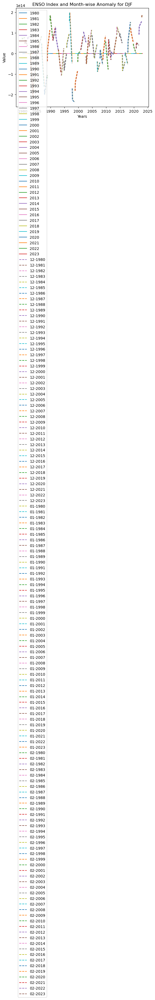

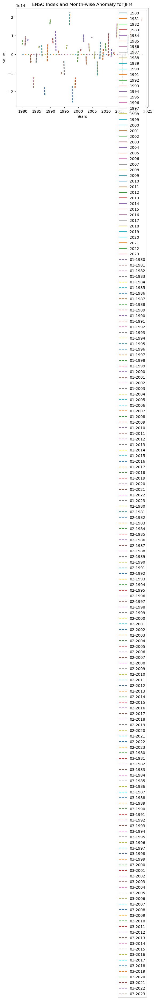

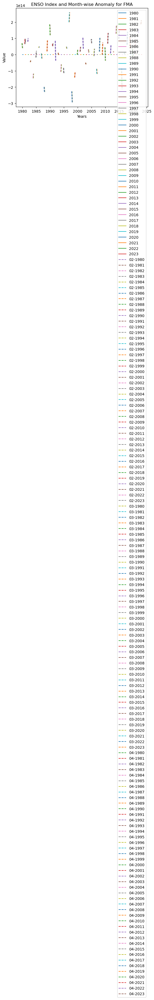

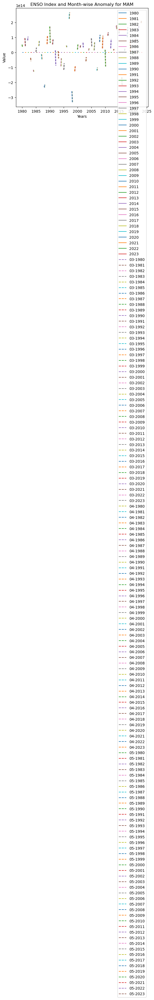

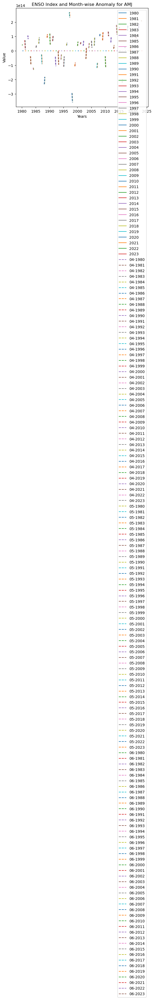

...

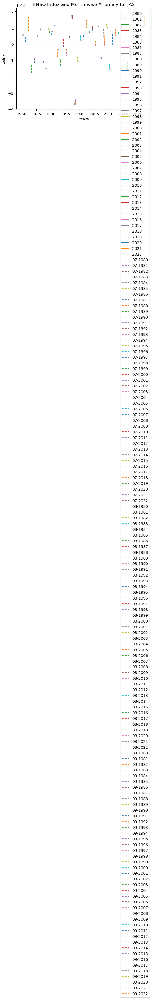

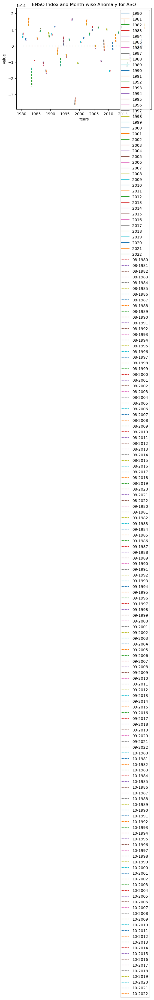

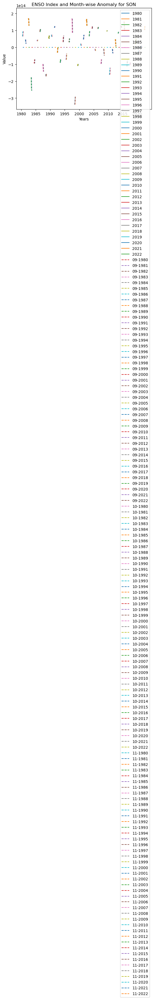

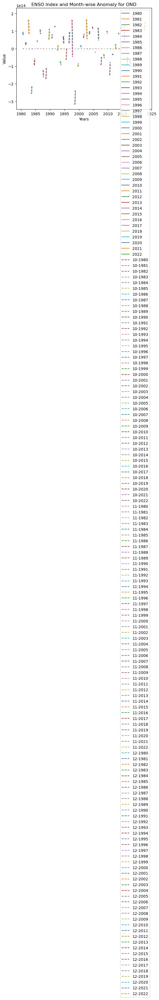

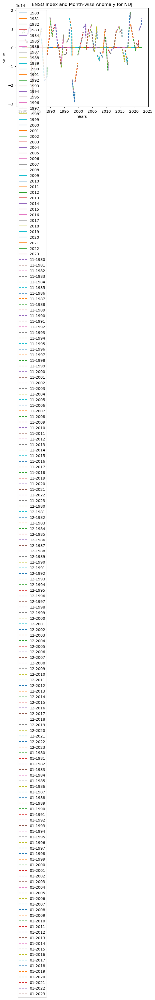

In [216]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Calculate 3-month rolling means for 'ENSO index'
df['Rolling Mean'] = df['ENSO index'].rolling(window=3).mean()

# Define the seasons and corresponding months
seasons = {
    'DJF': ['12', '01', '02'],
    'JFM': ['01', '02', '03'],
    'FMA': ['02', '03', '04'],
    'MAM': ['03', '04', '05'],
    'AMJ': ['04', '05', '06'],
    'MJJ': ['05', '06', '07'],
    'JJA': ['06', '07', '08'],
    'JAS': ['07', '08', '09'],
    'ASO': ['08', '09', '10'],
    'SON': ['09', '10', '11'],
    'OND': ['10', '11', '12'],
    'NDJ': ['11', '12', '01'],
}

# Initialize a DataFrame to store the correlation analysis results
correlation_results = pd.DataFrame(columns=['Season', 'Month', 'Correlation'])

# Iterate over the seasons
for season, months in seasons.items():
    # Create a subset for the current season
    subset = df[df.index.month.isin([int(month) for month in months])]

    # Plot the ENSO indices for each year
    fig, ax = plt.subplots()
    for year, data in subset.groupby(subset.index.year):
        ax.plot(data.index, data['ENSO index'], label=str(year))

    # Plot the month-wise anomalies for each year
    for i, month in enumerate(months):
        for year, data in subset.groupby(subset.index.year):
            ax.plot(data.index - pd.DateOffset(months=i + 1), data['Anomaly'], linestyle='--',
                    label=f'{month}-{year}')

            # Perform correlation analysis between ENSO index and month-wise anomaly
            correlation = data['ENSO index'].corr(data['Anomaly'])
            correlation_results = correlation_results.append(
                {'Season': season, 'Month': f'{month}-{year}', 'Correlation': correlation}, ignore_index=True)

    # Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Month-wise Anomaly for {season}')
    ax.legend()

    # Save the plot
    plt.savefig(f'{season}_plot.png')

# Display the correlation analysis results
print(correlation_results)


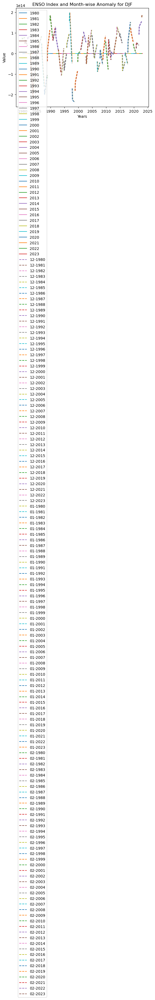

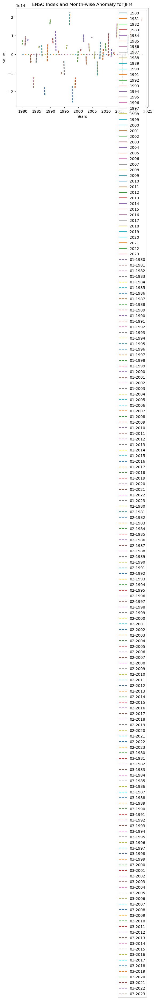

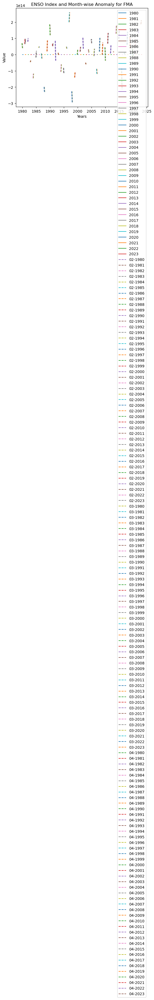

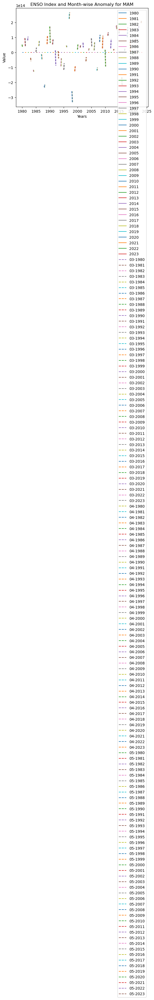

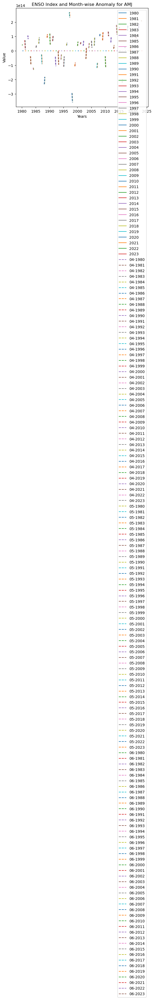

C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


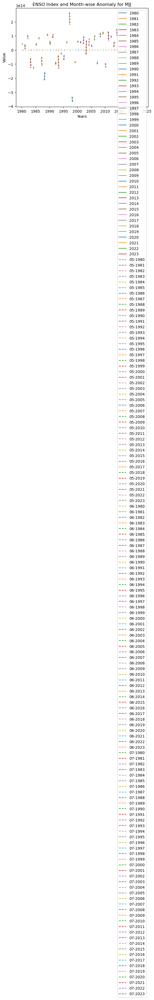

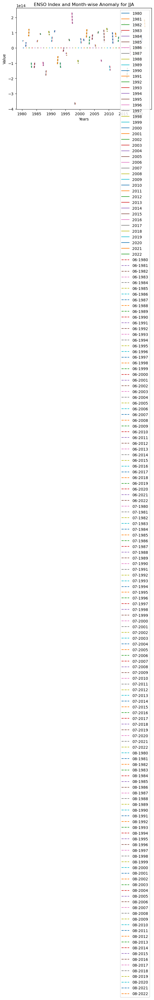

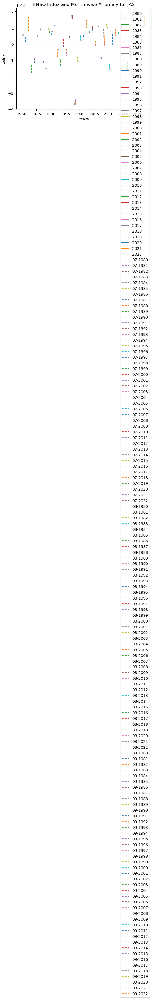

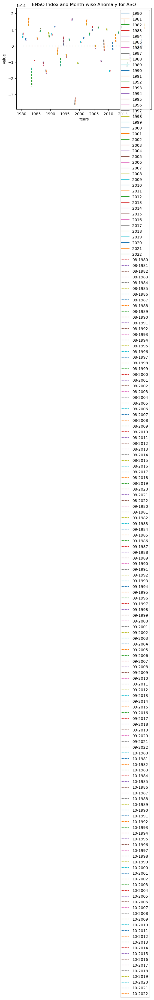

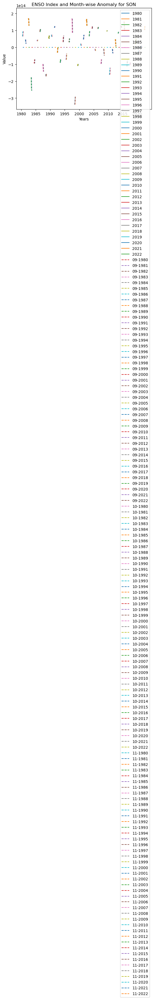

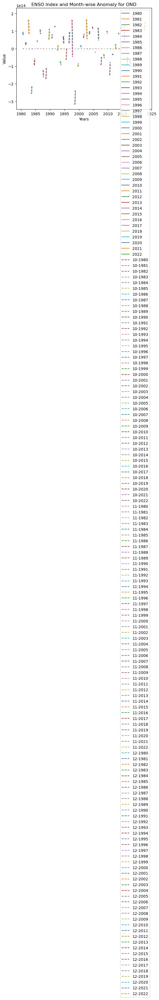

C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\shahe\anaconda3\lib\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


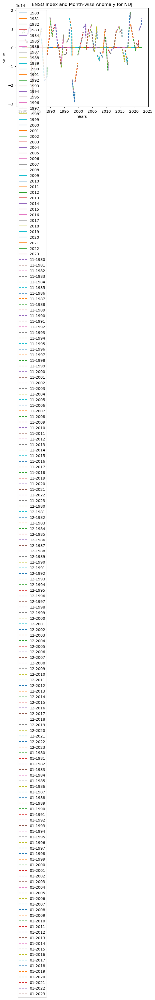

     Season    Month  Correlation
0       DJF  12-1980    -0.011525
1       DJF  12-1981    -0.985241
2       DJF  12-1982     0.491771
3       DJF  12-1983     0.995794
4       DJF  12-1984    -0.714818
...     ...      ...          ...
1564    NDJ  01-2019     0.999643
1565    NDJ  01-2020     0.982761
1566    NDJ  01-2021    -0.984200
1567    NDJ  01-2022     0.998718
1568    NDJ  01-2023          NaN

[1569 rows x 3 columns]


In [219]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Calculate 3-month rolling means for 'ENSO index'
df['Rolling Mean'] = df['ENSO index'].rolling(window=3).mean()

# Define the seasons and corresponding months
seasons = {
    'DJF': ['12', '01', '02'],
    'JFM': ['01', '02', '03'],
    'FMA': ['02', '03', '04'],
    'MAM': ['03', '04', '05'],
    'AMJ': ['04', '05', '06'],
    'MJJ': ['05', '06', '07'],
    'JJA': ['06', '07', '08'],
    'JAS': ['07', '08', '09'],
    'ASO': ['08', '09', '10'],
    'SON': ['09', '10', '11'],
    'OND': ['10', '11', '12'],
    'NDJ': ['11', '12', '01'],
}

# Initialize a list to store the correlation analysis results
correlation_results = []

# Iterate over the seasons
for season, months in seasons.items():
    # Create a subset for the current season
    subset = df[df.index.month.isin([int(month) for month in months])]

    # Plot the ENSO indices for each year
    fig, ax = plt.subplots()
    for year, data in subset.groupby(subset.index.year):
        ax.plot(data.index, data['ENSO index'], label=str(year))

    # Plot the month-wise anomalies for each year
    for i, month in enumerate(months):
        for year, data in subset.groupby(subset.index.year):
            ax.plot(data.index - pd.DateOffset(months=i + 1), data['Anomaly'], linestyle='--',
                    label=f'{month}-{year}')

            # Perform correlation analysis between ENSO index and month-wise anomaly
            correlation = data['ENSO index'].corr(data['Anomaly'])
            correlation_results.append({'Season': season, 'Month': f'{month}-{year}', 'Correlation': correlation})

    # Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Month-wise Anomaly for {season}')
    ax.legend()

    # Save the plot
    plt.savefig(f'{season}_plot.png')
    plt.show()

# Create a DataFrame from the correlation analysis results
correlation_results_df = pd.DataFrame(correlation_results)

# Display the correlation analysis results
print(correlation_results_df)


In [225]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Define the seasons and corresponding months
seasons = {
    'DJF': {'months': ['12', '01', '02'], 'prior_months': ['06', '07', '08', '09', '10', '11'], 'anomaly_months': ['07', '08', '09', '10', '11']},
    'JFM': {'months': ['01', '02', '03'], 'prior_months': ['07', '08', '09', '10', '11', '12'], 'anomaly_months': ['08', '09', '10', '11', '12']},
    'FMA': {'months': ['02', '03', '04'], 'prior_months': ['08', '09', '10', '11', '12', '01'], 'anomaly_months': ['09', '10', '11', '12', '01']},
    'MAM': {'months': ['03', '04', '05'], 'prior_months': ['09', '10', '11', '12', '01', '02'], 'anomaly_months': ['10', '11', '12', '01', '02']},
    'AMJ': {'months': ['04', '05', '06'], 'prior_months': ['10', '11', '12', '01', '02', '03'], 'anomaly_months': ['11', '12', '01', '02', '03']},
    'MJJ': {'months': ['05', '06', '07'], 'prior_months': ['11', '12', '01', '02', '03', '04'], 'anomaly_months': ['12', '01', '02', '03', '04']},
    'JJA': {'months': ['06', '07', '08'], 'prior_months': ['12', '01', '02', '03', '04', '05'], 'anomaly_months': ['01', '02', '03', '04', '05']},
    'JAS': {'months': ['07', '08', '09'], 'prior_months': ['01', '02', '03', '04', '05', '06'], 'anomaly_months': ['02', '03', '04', '05', '06']},
    'ASO': {'months': ['08', '09', '10'], 'prior_months': ['02', '03', '04', '05', '06', '07'], 'anomaly_months': ['03', '04', '05', '06', '07']},
    'SON': {'months': ['09', '10', '11'], 'prior_months': ['03', '04', '05', '06', '07', '08'], 'anomaly_months': ['04', '05', '06', '07', '08']},
    'OND': {'months': ['10', '11', '12'], 'prior_months': ['04', '05', '06', '07', '08', '09'], 'anomaly_months': ['05', '06', '07', '08', '09']},
    'NDJ': {'months': ['11', '12', '01'], 'prior_months': ['05', '06', '07', '08', '09', '10'], 'anomaly_months': ['06', '07', '08', '09', '10']},
}

# Initialize a DataFrame to store the correlation analysis results
correlation_results = pd.DataFrame(columns=['Season', 'Month', 'Correlation'])

# Iterate over the seasons
for season, data in seasons.items():
    months = data['months']
    prior_months = data['prior_months']
    anomaly_months = data['anomaly_months']
    
    # Create a subset for the current season
    subset = df[df.index.month.isin([int(month) for month in months])]
    
    # Initialize lists to store data for ENSO index, prior months, and anomalies
    enso_data = []
    prior_data = []
    anomaly_data = [[] for _ in range(len(anomaly_months))]
    
    # Iterate over the years
    for year, data in subset.groupby(subset.index.year):
        enso_data.append(data['ENSO index'])
        
        # Get data for prior months
        prior_data_year = []
        for i, month in enumerate(prior_months):
            prior_data_year.append(df.loc[(df.index.year == year-1) & (df.index.month == int(month)), 'ENSO index'].values[0])
        prior_data.append(prior_data_year)
        
        # Get data for anomaly months
        for i, month in enumerate(anomaly_months):
            anomaly_data[i].append(df.loc[(df.index.year == year) & (df.index.month == int(month)), 'Anomaly'].values[0])
    
    # Plot ENSO index lines for each year
    fig, ax = plt.subplots()
    for i in range(len(enso_data)):
        ax.plot(enso_data[i].index, enso_data[i], label=f'{months[0]}-{months[2]} {i+1}')
    
    # Plot prior month lines for each year
    for i in range(len(prior_data)):
        ax.plot(enso_data[i].index, prior_data[i], linestyle='--', label=f'Prior Months {i+1}')
    
    # Plot anomaly lines for each month
    for i in range(len(anomaly_months)):
        for j in range(len(anomaly_data[i])):
            ax.plot(enso_data[j].index, anomaly_data[i][j], linestyle=':', label=f'Anomaly {anomaly_months[i]} {j+1}')
            
            # Perform correlation analysis between ENSO index and anomaly
            correlation = enso_data[j].corr(anomaly_data[i][j])
            correlation_results = correlation_results.append(
                {'Season': season, 'Month': f'{anomaly_months[i]}-{j+1}', 'Correlation': correlation}, ignore_index=True)
    
    # Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Anomalies for {season}')
    ax.legend()
    
    # Save the plot
    plt.savefig(f'{season}_plot.png')
    plt.show()

# Display the correlation analysis results
print(correlation_results)


IndexError: index 0 is out of bounds for axis 0 with size 0

ValueError: x and y must have same first dimension, but have shapes (3,) and (0,)

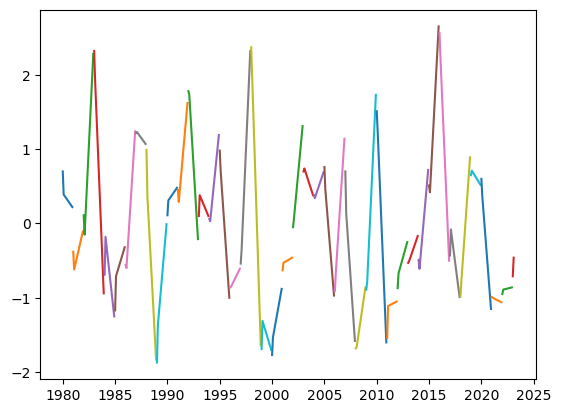

In [228]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is already defined as 'df'

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)

# Define the seasons and corresponding months
seasons = {
    'DJF': {'months': ['12', '01', '02'], 'prior_months': ['06', '07', '08', '09', '10', '11'], 'anomaly_months': ['07', '08', '09', '10', '11']},
    'JFM': {'months': ['01', '02', '03'], 'prior_months': ['07', '08', '09', '10', '11', '12'], 'anomaly_months': ['08', '09', '10', '11', '12']},
    'FMA': {'months': ['02', '03', '04'], 'prior_months': ['08', '09', '10', '11', '12', '01'], 'anomaly_months': ['09', '10', '11', '12', '01']},
    'MAM': {'months': ['03', '04', '05'], 'prior_months': ['09', '10', '11', '12', '01', '02'], 'anomaly_months': ['10', '11', '12', '01', '02']},
    'AMJ': {'months': ['04', '05', '06'], 'prior_months': ['10', '11', '12', '01', '02', '03'], 'anomaly_months': ['11', '12', '01', '02', '03']},
    'MJJ': {'months': ['05', '06', '07'], 'prior_months': ['11', '12', '01', '02', '03', '04'], 'anomaly_months': ['12', '01', '02', '03', '04']},
    'JJA': {'months': ['06', '07', '08'], 'prior_months': ['12', '01', '02', '03', '04', '05'], 'anomaly_months': ['01', '02', '03', '04', '05']},
    'JAS': {'months': ['07', '08', '09'], 'prior_months': ['01', '02', '03', '04', '05', '06'], 'anomaly_months': ['02', '03', '04', '05', '06']},
    'ASO': {'months': ['08', '09', '10'], 'prior_months': ['02', '03', '04', '05', '06', '07'], 'anomaly_months': ['03', '04', '05', '06', '07']},
    'SON': {'months': ['09', '10', '11'], 'prior_months': ['03', '04', '05', '06', '07', '08'], 'anomaly_months': ['04', '05', '06', '07', '08']},
    'OND': {'months': ['10', '11', '12'], 'prior_months': ['04', '05', '06', '07', '08', '09'], 'anomaly_months': ['05', '06', '07', '08', '09']},
    'NDJ': {'months': ['11', '12', '01'], 'prior_months': ['05', '06', '07', '08', '09', '10'], 'anomaly_months': ['06', '07', '08', '09', '10']},
}

# Initialize a DataFrame to store the correlation analysis results
correlation_results = pd.DataFrame(columns=['Season', 'Month', 'Correlation'])

# Iterate over the seasons
for season, data in seasons.items():
    months = data['months']
    prior_months = data['prior_months']
    anomaly_months = data['anomaly_months']
    
    # Create a subset for the current season
    subset = df[df.index.month.isin([int(month) for month in months])]
    
    # Initialize lists to store data for ENSO index, prior months, and anomalies
    enso_data = []
    prior_data = []
    anomaly_data = [[] for _ in range(len(anomaly_months))]
    
    # Iterate over the years
    for year, data in subset.groupby(subset.index.year):
        enso_data.append(data['ENSO index'])
        
        # Get data for prior months
        prior_data_year = []
        for i, month in enumerate(prior_months):
            prior_data_month = df.loc[(df.index.year == year-1) & (df.index.month == int(month)), 'ENSO index']
            if len(prior_data_month) > 0:
                prior_data_year.append(prior_data_month.values[0])
        prior_data.append(prior_data_year)
        
        # Get data for anomaly months
        for i, month in enumerate(anomaly_months):
            anomaly_data_month = df.loc[(df.index.year == year) & (df.index.month == int(month)), 'Anomaly']
            if len(anomaly_data_month) > 0:
                anomaly_data[i].append(anomaly_data_month.values[0])
    
    # Plot ENSO index lines for each year
    fig, ax = plt.subplots()
    for i in range(len(enso_data)):
        ax.plot(enso_data[i].index, enso_data[i], label=f'{months[0]}-{months[2]} {i+1}')
    
    # Plot prior month lines for each year
    for i in range(len(prior_data)):
        ax.plot(enso_data[i].index, prior_data[i], linestyle='--', label=f'Prior Months {i+1}')
    
    # Plot anomaly lines for each month
    for i in range(len(anomaly_months)):
        for j in range(len(anomaly_data[i])):
            ax.plot(enso_data[j].index, anomaly_data[i][j], linestyle=':', label=f'Anomaly {anomaly_months[i]} {j+1}')
            
            # Perform correlation analysis between ENSO index and anomaly
            correlation = enso_data[j].corr(anomaly_data[i][j])
            correlation_results = correlation_results.append(
                {'Season': season, 'Month': f'{anomaly_months[i]}-{j+1}', 'Correlation': correlation}, ignore_index=True)
    

# Set the labels and legend
    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    ax.set_title(f'ENSO Index and Anomalies for {season}')
    ax.legend()
    
    # Save the plot
    plt.savefig(f'{season}_plot.png')
    plt.show()

# Display the correlation analysis results
print(correlation_results)
